In [1]:
import matplotlib as mpl
from matplotlib import cm
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import warnings
warnings.filterwarnings("ignore")

# Add font
import os, glob

# Use glob to get all file paths
file_paths = glob.glob( "/home/goldpm1/miniconda3/envs/scvelo/lib/python3.12/site-packages/matplotlib/mpl-data/fonts/ttf/*" )
absolute_file_paths = [os.path.abspath(file_path) for file_path in file_paths]
for absolute_file_path in absolute_file_paths:
    try:
        mpl.font_manager.fontManager.addfont( absolute_file_path )
    except:
        continue
# for font_name in  [f.name for f in mpl.font_manager.fontManager.ttflist  ] :
#     print(font_name)


# #1. matplotlib 기본 colormap
# cmaps = plt.colormaps()
# for cm in cmaps:
#     print(cm)

#2. Liinear colormap  (continuous variable)
my_cmap = LinearSegmentedColormap.from_list ( 'my_cmap1',  ['#FFFFFF', '#CF7CDE', '#B472CC' , '#A468BA', '#7E508F' ], gamma = 2)

# Pallette
import palettable
tabl_20 =  palettable.tableau.Tableau_20.mpl_colors
vivid_10 =  palettable.cartocolors.qualitative.Vivid_10.mpl_colors

In [2]:
import numpy as np
import scanpy as sc
import anndata as ad
#import pooch
import pandas as pd
import scvelo as scv
import scanorama, decoupler, omnipath
from pathlib import Path
from pydeseq2.dds import DeseqDataSet, DefaultInference
from pydeseq2.ds import DeseqStats
import go, random
mapper, goeaobj, GO_items, inv_map = go.main()

plt.rcParams.update({'font.size': '15', "font.family" : "Arial"} )
sc.set_figure_params ( dpi = 100,  facecolor="white", color_map = "rainbow" )

      20,627 lines READ:  /home/goldpm1/resources/goatools/gene_result.txt
      20,607 geneids WROTE: genes_ncbi_homo_sapiens_proteincoding.py
/home/goldpm1/resources/goatools/go-basic.obo: fmt(1.2) rel(2024-01-17) 45,869 Terms
**NOTE: DEFAULT TAXID STORED FROM gene2go IS 9606 (human)

HMS:0:01:39.251096 346,071 annotations, 20,759 genes, 18,733 GOs, 1 taxids READ: /home/goldpm1/resources/goatools/gene2go 

Load BP Ontology Enrichment Analysis ...
 83% 17,024 of 20,607 population items found in association

Load CC Ontology Enrichment Analysis ...
 88% 18,139 of 20,607 population items found in association

Load MF Ontology Enrichment Analysis ...
 85% 17,598 of 20,607 population items found in association


In [3]:
def common_genes ( adata, li):
    return (sorted (list (  set (li) & set (adata.var_names ))))

class OBJECT:
    def __init__ ( self, Sample_ID):
        self.Sample_ID = Sample_ID
        import os
        if not os.path.exists ( "/data/project/OPLL/02.scRNA/script/scanpy/figures/{}".format (Sample_ID) ):
            os.makedirs ( "/data/project/OPLL/02.scRNA/script/scanpy/figures/{}".format (Sample_ID) )

    def input_10x ( self, INPUT_DIR, LDATA_PATH  ):
        self.INPUT_DIR = INPUT_DIR
        self.SavePATH = "/data/project/OPLL/02.scRNA/script/scanpy/AnnData"
        self.adata = sc.read_10x_mtx( INPUT_DIR, var_names = 'gene_symbols', make_unique=True, prefix=None)
        self.adata.obs["Sample"] = self.Sample_ID

        self.ldata = scv.read ( LDATA_PATH )                      # 미리 loom data와 합쳐주기
        self.adata = scv.utils.merge ( self.adata, self.ldata )        # 3분 이상 걸림
        
        if "Mouse" in self.Sample_ID:
            gene_conversion_df = pd.read_csv ( "/home/goldpm1/resources/ALL_hs_mm_rn_JHKIM.txt", sep = "\t").iloc[:, 0:6]
            dict_M_to_H = {}
            for i in range ( self.adata.var.shape[0] ):
                dict_M_to_H [ self.adata.var.index[ i ] ] = self.adata.var.index[ i ].upper()

            d = pd.merge (  self.adata.var, gene_conversion_df, left_on = "gene_ids", right_on = "Mouse gene stable ID", how = 'left' ).drop_duplicates( ['Mouse gene name'], keep = 'first')
            for i in range  (d.shape[0] ):
                dict_M_to_H [  d["Mouse gene name"].iloc[i] ] = d["Gene name"].iloc[i]

            # Dictionary를 이용해 human gene으로 바꿔주기
            new_index = []
            for i in range ( self.adata.var.shape[0] ):
                new_index.append (  dict_M_to_H [ self.adata.var.index [i] ] ) 
            self.adata.var.index = new_index
            self.adata.var["Accession"] = new_index

            # n (mouse): 1 (human) 으로 matching 되는 경우, duplication이 생기게 된다
            temp = self.adata.var.reset_index()
            self.adata = self.adata [:, temp.drop_duplicates( ["Accession"], keep = 'first').index.tolist() ]
            # print ( self.adata.var.shape )

        #self.adata.var.index = self.adata.var.index.str.upper()    # 미리 대문자로 바꿔줌.  ldata는 다 대문자이기 떄문
        print ( "Cell * Gene : {}".format ( self.adata.X.shape) )
        self.adata.write( self.SavePATH + "/" + self.Sample_ID + ".raw.h5ad" )

    def input_parse ( self, INPUT_DIR):
        self.SavePATH = "/data/project/OPLL/02.scRNA/script/scanpy/AnnData"
        self.adata = sc.read_mtx( INPUT_DIR + "/count_matrix.mtx" )
        self.adata.var = pd.read_csv(INPUT_DIR + "/all_genes.csv" )
        self.adata.var.set_index('gene_name', inplace=True)
        self.adata.var.index.name = None
        self.adata.var_names_make_unique()
        self.adata.obs = pd.read_csv(INPUT_DIR + "/cell_metadata.csv" )
        self.adata.obs.set_index('bc_wells', inplace=True)
        self.adata.obs.index.name = None
        self.adata.obs_names_make_unique()
        self.adata.obs ["Sample"] =  self.adata.obs ["sample"] 
        print('median transcript count per cell: ' + str( self.adata.obs['tscp_count'].median(0) ) )
        print('median gene count per cell: ' + str( self.adata.obs['gene_count'].median(0) ) )
    
    def parse_subset ( self, sample_interest ):
        self.adata = self.adata [ self.adata.obs["sample"].isin ( sample_interest ) ]

    def input_from_adata ( self, adata ):
         self.adata = adata
         self.SavePATH = "/data/project/OPLL/02.scRNA/script/scanpy/AnnData"
         print ( "Cell * Gene : {}".format ( self.adata.X.shape) )
         

    def save_h5ad_preprocessing ( self ):
        self.adata.write( self.SavePATH + "/" + self.Sample_ID + ".preprocessing.h5ad" )

    def save_h5ad_clustered ( self ):
        self.adata.write( self.SavePATH + "/" + self.Sample_ID + ".clustered.h5ad" )

    def save_h5ad ( self ):
        self.adata.write( self.SavePATH + "/" + self.Sample_ID + ".h5ad" )

    def filter_manual ( self, min_genes, min_cells):       # min_genes = 200, min_cells = 3
        sc.pp.filter_cells( self.adata, min_genes = min_genes )   #get rid of cells with fewer than 200 genes
        sc.pp.filter_genes( self.adata, min_cells = min_cells )      #get rid of genes that are found in fewer than 3 cells     
        print ( "\tCell & Gene Filter 후 : {}".format ( self.adata.X.shape) )

    def filter_upper_lower ( self, upper, lower):         # upper = 0.98  lower = 0.02
        upper_lim = np.quantile( self.adata.obs.n_genes_by_counts.values, upper )
        lower_lim = np.quantile( self.adata.obs.n_genes_by_counts.values, lower  )
        # self.adata =  self.adata[ self.adata.obs.n_genes_by_counts < 7000, :] #example if you wanted to pick a number yourself
        self.adata =  self.adata[( self.adata.obs.n_genes_by_counts < upper_lim) & ( self.adata.obs.n_genes_by_counts > lower_lim)]
        print ( "\tFilter 후 : {}".format ( self.adata.X.shape) )

    def filter_mito_manual ( self, threshold = 20, jitter = 0.4, visualization = True ):
        self.visualization_mito = visualization
        self.adata.var ['mt'] = self.adata.var_names.str.startswith('MT-')  # Human은 MT-,  Mosue는 Mt-
        self.adata.var ['ribo'] = self.adata.var_names.str.startswith( ("RPS", "RPL") )  # Human은 MT-,  Mosue는 Mt-
        self.adata.var ['hb'] = self.adata.var_names.str.startswith('^HB[^(P)]')  # Hemoglobin genes
        sc.pp.calculate_qc_metrics( self.adata, qc_vars = ['mt'], percent_top=None, log1p=False, inplace=True)      # adata.obs에  pct_counts_mt를 생성해줌
        sc.settings.set_figure_params(dpi = 75, facecolor="white")
        if self.visualization_mito == True:
            sc.pl.violin( self.adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter = jitter, multi_panel=True)
        self.adata =  self.adata[ self.adata.obs.pct_counts_mt < threshold]
        print ( "\tMito Filter 후 : {}".format ( self.adata.X.shape) )

    def scrublet (self):
        sc.pp.scrublet( self.adata )       # self.adata에  predicted_doublet, double_score가 생성됨
        print ( "\tscrublet complete : {}개의 doublet. filter 시작".format ( self.adata.obs.loc [ self.adata.obs["predicted_doublet"] == True, :].shape[0] ))
        self.adata = self.adata [ self.adata.obs["predicted_doublet"] == False ]

    def normalize ( self, target_sum = 30000 ):
        # Count 복사
        self.adata.raw = self.adata.copy()
        self.adata.layers['counts'] = self.adata.X.copy()
        #if "Parse" not in self.Sample_ID:
        sc.pp.normalize_total( self.adata, target_sum = target_sum )         # 모든 gene (UMI)의 합이 10000이 되도록  noramlize
        sc.pp.log1p ( self.adata )

    def feature_selection_PCA ( self, n_top_genes = 1500 ):
        # Feature selection 
        #if "Parse" in self.Sample_ID:
        #if "10x" in self.Sample_ID:
        if n_top_genes > 0:
            sc.pp.highly_variable_genes( self.adata, n_top_genes  = n_top_genes, layer = 'counts', flavor = 'seurat_v3', batch_key = "Sample") #these are default value
        else:
            sc.pp.highly_variable_genes( self.adata, min_mean = 0.0125, max_mean = 3, min_disp = 0.5, batch_key = "Sample") #these are default value
        self.adata_raw = self.adata
        self.adata = self.adata[:, self.adata.var.highly_variable] 
        
        print ( "\tFeature selection 후 : {}".format ( self.adata.X.shape) )

        sc.pp.regress_out(self.adata, ['total_counts', 'pct_counts_mt']) #Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed
        sc.pp.scale(self.adata, max_value = 10) #scale each gene to unit variance

        # PCA
        sc.tl.pca(self.adata, svd_solver = 'arpack')
        sc.settings.figdir = "/data/project/OPLL/02.scRNA/script/scanpy/figures/{}/".format (self.Sample_ID) 
        sc.pl.pca_variance_ratio(self.adata, save = ":" + self.Sample_ID + ".png" )  # 이걸 보고 n_pc를 정함




    def clustering_leiden (self, n_neighbors = 20, n_pcs = 10, leiden_resolution = [0.25, 0.4, 0.6], dpi = 150, size = 20, alpha = 0.8, palette = tabl_20):
        # k-NN graph construction
        sc.pp.neighbors( self.adata, n_neighbors = n_neighbors, n_pcs = n_pcs)
        # Umap 
        sc.tl.umap( self.adata )
        # k-NN 을 기반으로 하여 Leiden or Louvain algorithm으로 clustering함  (self.adata.obs에 leiden이 생성됨)
        for res in leiden_resolution:
             sc.tl.leiden( self.adata, key_added="leiden_res_{}".format(res), resolution = res, flavor="igraph"   )    # resolution을 각각에 대해서 수행하고,  key를 붙여줌
        # clustering 한 것을 UMAP visualization
        sc.set_figure_params ( dpi = dpi )
        sc.settings.figdir = "/data/project/OPLL/02.scRNA/script/scanpy/figures/{}/".format (self.Sample_ID) 
        sc.pl.umap( self.adata, 
                            save = ":" + self.Sample_ID + "_01-1.Clustering.png",
                            size = size, alpha = alpha, 
                            color = [ "leiden_res_{}".format( str(res) )  for res in leiden_resolution ], 
                            title = [ "{}:leiden_res_{}".format(self.Sample_ID,  str(res) ) for res in leiden_resolution] , 
                            palette = palette, 
                            legend_loc="on data")        #color="sample",    adata.var.columns,  adata.obs 중에에 고르면 됨

    def clustering_louvain (self, n_neighbors = 20, n_pcs = 10, louvain_resolution = [0.25, 0.4, 0.6], dpi = 150, size = 20, alpha = 0.8, palette = tabl_20):
        # k-NN graph construction
        sc.pp.neighbors( self.adata, n_neighbors = n_neighbors, n_pcs = n_pcs)
        # Umap 
        sc.tl.umap( self.adata )
        # k-NN 을 기반으로 하여 Leiden or Louvain algorithm으로 clustering함  (self.adata.obs에 leiden이 생성됨)
        for res in louvain_resolution:
             sc.tl.louvain ( self.adata, key_added="louvain_res_{}".format(res), resolution = res, flavor="igraph"   )    # resolution을 각각에 대해서 수행하고,  key를 붙여줌
        # clustering 한 것을 UMAP visualization
        sc.set_figure_params ( dpi = dpi )
        fig, ax = plt.subplots(nrows= 1, ncols = len(louvain_resolution) , figsize = (4 *  len(louvain_resolution) , 4  ))
        if len(louvain_resolution) == 1:
                sc.pl.umap( self.adata, 
                                    ax = ax,
                                    size = size, alpha = alpha, 
                                    color = "louvain_res_{}".format( str(res) )  , 
                                    title = "{}:louvain_res_{}".format(self.Sample_ID,  str(res) )  , 
                                    palette = palette, 
                                    legend_loc="on data")        #color="sample",    adata.var.columns,  adata.obs 중에에 고르면 됨            
        else:
            for i, res in enumerate (louvain_resolution):
                sc.pl.umap( self.adata, 
                                    ax = ax[i],
                                    size = size, alpha = alpha, 
                                    color = "louvain_res_{}".format( str(res) )  , 
                                    title = "{}:louvain_res_{}".format(self.Sample_ID,  str(res) )  , 
                                    palette = palette, 
                                    legend_loc="on data")        #color="sample",    adata.var.columns,  adata.obs 중에에 고르면 됨
        fig.savefig (self.OUTPUT_FIG_DIR + "/01.Clustering_louvain:{}.jpg".format (self.Sample_ID) , dpi = 300)
        fig.show()

    def clustering_leiden_3D (self, n_neighbors = 20, n_pcs = 10, leiden_resolution = [0.25, 0.4, 0.6], dpi = 150, size = 20, alpha = 0.8, palette = tabl_20):
        sc.tl.umap( self.adata, n_components = 3 )
        sc.tl.leiden( self.adata, key_added="leiden_res_{}".format( leiden_resolution ), resolution = leiden_resolution, flavor="igraph"   )    # resolution을 각각에 대해서 수행하고,  key를 붙여줌

        fig = plt.figure (figsize = (size, size))
        ax = fig.add_subplot (projection = '3d')
        ax.scatter ( self.adata.obsm['X_umap'][:, 0],  self.adata.obsm['X_umap'][:, 1], self.adata.obsm['X_umap'][:, 2], c = self.adata.obs["leiden_res_0.25"].astype('int'), alpha = 0.8 )
        x_center = ( self.adata.obsm['X_umap'][:, 0].max() + self.adata.obsm['X_umap'][:, 0].min() )   / 2
        y_center = ( self.adata.obsm['X_umap'][:, 1].max() + self.adata.obsm['X_umap'][:, 1].min() )   / 2
        z_center = ( self.adata.obsm['X_umap'][:, 2].max() + self.adata.obsm['X_umap'][:, 2].min() )   / 2

        ax.plot ( [x_center, x_center], [y_center, y_center], [self.adata.obsm['X_umap'][:, 2].min() - 2, self.adata.obsm['X_umap'][:, 2].max() + 2], c = 'k', lw = 5)
        ax.plot ( [x_center, x_center], [self.adata.obsm['X_umap'][:, 1].min() - 2, self.adata.obsm['X_umap'][:, 1].max() + 2], [z_center, z_center],  c = 'k', lw = 5)
        ax.plot ( [self.adata.obsm['X_umap'][:, 0].min() - 2, self.adata.obsm['X_umap'][:, 0].max() + 2], [y_center, y_center], [z_center, z_center],  c = 'k', lw = 5)

        ax.axis('off')
        plt.show()

    def find_marker_genes ( self  ):
        self.adata.marker_genes = {
            "Osteoblast": common_genes ( self.adata, ["CD90", "OL1A1", "SPARC", "SP7", "SPP1", "BGLAP", "BGLAP2", "IBSP", "ALPL", "GJA1", "RUNX2" ,"WNT5A"] ) ,
            "Chondrocyte": common_genes ( self.adata, ["ACAN", "COL9A1", "SDC3", "SOX6", "SOX9", "SPARC", "COL2A1", "AGC1", "COMP", "MMP13", "MATN4"] ) ,
            "Fibroblasts": common_genes ( self.adata,  ["COL1A1", "COL1A2", "COL5A1", "LOXL1", "LUM", "FBLN1", "FBLN2", "CD34", "PDGFRA", "VIM", "CD90", "CD10", "CD29", "CD105", "CD34", "CD44"] ),
            "TSPC": common_genes ( self.adata, ["NES", "SCX", "CD146", "CD44", "CD90", "CD29", "CD105", "TPPP3", "PDGFRA", "CD34", "TNMD", "SCA1", "FMOD", "MKX", "THBS4"] ) ,
            "NK cells": common_genes ( self.adata,  ["CD56", "CD2", "CD16", "CD94", "NKp46", "CD11b", "CD161", "CD314", "CD69", "NKG7", "CD122", "NKG2D", "GZMB", "GZMA", "GZMM", "FCGR3A", "GNLY", "COX6A2", "ZMAT4", "KIR2DL4", "NKG7"] ),
            "Neutrophils": common_genes ( self.adata, ["CD66b", "CD11b", "CD15", "CD16", "CXCL8", "FCGR3B", "MNDA", "CXCR2", "MPO", "ELANE", "PRTN3", "MPO", "AZU1", "LYZ", "S100A8", "S100A9", "PI3", "CHI3L1", "ANXA3", "CXCL1", "TGM3", "BTNL3", "C4BPA", "MMP9", "CD24", "BPI", "LTF", "GCA"] ) ,
            "Basophils": common_genes (  self.adata,  ["CD63", "CD203c", "CD123", "CLC", "MS4A3", "TCN1", "CPA3", "HDC", "GATA2", "MS4A2", "IL4", "GCSAML", "GATA2", "TPSAB1"] ),
            "Monocytes": common_genes ( self.adata,  ["CD14", "CD11b", "CD68", "HLA-DR", "CD33", "CD11c", "CD123", "CD15", "CD3D", "CD3E", "CD3G", "CD3Z", "CD66b", "VCAN", "S100A12", "CXCL8", "S100A8", "S100A9", "LYZ", "CST3"] ),
            "Macrophages": common_genes ( self.adata, ["CD68", "CD163", "CD14", "CD11b", "CD206", "CD80", "CD86", "CD16", "CD64", "CCL18", "CD115", "CD11c", "CD32", "HLA-DR", "MRC1", "MSR1", "GCA"] ) ,
            "Platelets": common_genes ( self.adata,  ["CD41", "CD42b", "CD61", "CD31", "PPBP", "PF4", "GNG11", "SDPR", "CLU", "CD41", "CD110"] ),
            "Endothelial cells": common_genes ( self.adata, ["PECAM1", "CD34", "KDR", "CDH5", "PROM1", "PDPN", "TEK", "FLT1", "VCAM1", "PTPRC", "VWF", "ENG", "MCAM", "ICAM1", "FLT4", "SELE"] ) ,
            "Erythrocytes": common_genes (  self.adata, ["PTPRC", "GYPA", "RUVBL1", "TFRC", "FOLR1", "CD36", "ITGA4", "HBB", "CD235a", "HBD", "CA1"] ),
            "Granulocytes": common_genes ( self.adata, ["CD203c", "CD15", "CD11b", "CD63", "CD66b", "CD123", "CD16", "CD33", "CD117", "CD45", "Fc-epsilon RI-alpha", "CD125", "CD13", "CD14", "CD25", "CD44", "CD69", "CD9", "HLA-DR", "CCR3", "CD116", "CD11c", "CD193", "CD24", "CD32", "CD43", "CXCL8", "FCGR3B", "MNDA", "SIGLEC8", "AZU1", "MPO", "CTSG", "LYZ"] ),
            "B cells": common_genes ( self.adata, ["CD19", "CD27", "IgD", "CD24", "CD20", "MS4A1", "PTPRC", "PAX5", "CD24", "CD38", "CD79A", "CXCL8", "S100A12", "LYZ", "CD79B", "TCL1A", "IGLL5", "HLA-DQA1", "HLA-DQB1", "VPREB3", "IGLL5"] ),
            "CD8+ T cells": common_genes ( self.adata, ["CD8", "CD2", "CD3D", "CD3E", "CD3G", "CD3Z", "CD45RA", "CD62L", "CD27", "CD127", "FOXP3", "CCR7", "CD45", "CD8A", "CD8B", "CCR6", "CD11b", "CD30", "CD6", "CTLA4", "IL2RA", "GZMB", "PTPRC", "SELL", "CCR7", "GNLY"]  ),
            "CD4+ T cells": common_genes ( self.adata, ["CD4", "CD2", "CD3D", "CD3E", "CD3G", "CD3Z", "CD45RA", "CD62L", "CD27", "CD127", "FOXP3", "CCR7", "CD45", "CCR6", "CD11b", "CD30", "CD6", "CTLA4", "IL2RA", "GZMB", "PTPRC", "SELL", "CCR7" ] )
        }


## Input

In [7]:
# #1. 10x
# Human_10x_PLF_1  =  OBJECT ( "Human_10x_PLF_1")
# Human_10x_PLF_1.input_10x ("/data/project/OPLL/02.scRNA/01.10X/01.human/01.PLF/240617/CellRanger/filtered_feature_bc_matrix", 
#                                                     "/data/project/OPLL/02.scRNA/01.10X/01.human/01.PLF/240617/CellRanger/velocyto/possorted_genome_bam_HKDSQ.loom")

# Human_10x_PLF_2  =  OBJECT ( "Human_10x_PLF_2")
# Human_10x_PLF_2.input_10x ("/data/project/OPLL/02.scRNA/01.10X/01.human/01.PLF/240806/CellRanger/filtered_feature_bc_matrix", 
#                                                     "/data/project/OPLL/02.scRNA/01.10X/01.human/01.PLF/240806/CellRanger/velocyto/possorted_genome_bam_TPIAZ.loom")

# Human_10x_NLF_1  =  OBJECT ( "Human_10x_NLF_1")
# Human_10x_NLF_1.input_10x ( "/data/project/OPLL/02.scRNA/01.10X/01.human/02.NLF/240401/CellRanger/filtered_feature_bc_matrix", 
#                                                     "/data/project/OPLL/02.scRNA/01.10X/01.human/02.NLF/240401/CellRanger/velocyto/possorted_genome_bam_T5BLH.loom")

# Human_10x_NLF_2  =  OBJECT ( "Human_10x_NLF_2")
# Human_10x_NLF_2.input_10x ( "/data/project/OPLL/02.scRNA/01.10X/01.human/02.NLF/240716/CellRanger/filtered_feature_bc_matrix", 
#                                                     "/data/project/OPLL/02.scRNA/01.10X/01.human/02.NLF/240716/CellRanger/velocyto/possorted_genome_bam_E8QVQ.loom")
        
# Mouse_10x_NLF  =  OBJECT ( "Mouse_10x_NLF")
# Mouse_10x_NLF.input_10x ("/data/project/OPLL/02.scRNA/01.10X/02.mouse/02.NLF/240320/CellRanger/filtered_feature_bc_matrix", 
#                                                     "/data/project/OPLL/02.scRNA/01.10X/02.mouse/02.NLF/240320/CellRanger/velocyto/possorted_genome_bam_JF6PW.loom")


# #2. Parse
# Human_Parse_PLF  =  OBJECT ( "Human_Parse_PLF")
# Human_Parse_PLF.input_parse ( "/data/project/OPLL/02.scRNA/11.parse/analysis_240415/all-sample/DGE_filtered" )
# Human_Parse_PLF.parse_subset ( [ "231129_LF", "231206_LF" ] ) 

# Human_Parse_OLF  =  OBJECT ( "Human_Parse_OLF")
# Human_Parse_OLF.input_parse ( "/data/project/OPLL/02.scRNA/11.parse/analysis_240415/all-sample/DGE_filtered" )
# Human_Parse_OLF.parse_subset ( [ "231129_OLF", "231213_OLF" ] ) 

# Human_Parse_231213_OLF  =  OBJECT ( "Human_Parse_231213_OLF")
# Human_Parse_231213_OLF.input_parse ( "/data/project/OPLL/02.scRNA/11.parse/analysis_240415/all-sample/DGE_filtered" )
# Human_Parse_231213_OLF.parse_subset ( [ "231213_OLF" ] ) 

# Human_Parse_Lamina  =  OBJECT ( "Human_Parse_Lamina")
# Human_Parse_Lamina.input_parse ( "/data/project/OPLL/02.scRNA/11.parse/analysis_240415/all-sample/DGE_filtered" )
# Human_Parse_Lamina.parse_subset ( [ "231129_Lamina", "231213_Lamina" ] ) 

# Human_Parse_OLFLamina  =  OBJECT ( "Human_Parse_OLFLamina")
# Human_Parse_OLFLamina.input_parse ( "/data/project/OPLL/02.scRNA/11.parse/analysis_240415/all-sample/DGE_filtered" )
# Human_Parse_OLFLamina.parse_subset ( [ "231129_OLF", "231213_OLF", "231129_Lamina", "231213_Lamina",  ] ) 


##3. Public
# Human_10x_Femur = OBJECT ("Human_10x_Femur")
# Human_10x_Femur.Sample_ID = "Human_10x_Femur"
# Human_10x_Femur.SavePATH = "/data/project/OPLL/02.scRNA/script/scanpy/AnnData"
# Human_10x_Femur.adata = sc.read_10x_h5 ( "/data/project/OPLL/02.scRNA/99.public/02.scRNA/01.bone/GSE217792_2023_Natoli_femur_canc_JOR/GSM6726767_Femur_non-union_01142020_filtered_feature_bc_matrix.h5" )
# Human_10x_Femur.adata.var_names_make_unique()
# Human_10x_Femur.adata.obs_names_make_unique()
# Human_10x_Femur.adata.obs["Sample"] = "GSM6726767"

BR_OPLL_1  =  OBJECT ( "BR_OPLL_1")
BR_OPLL_1.input_10x ( "/data/project/OPLL/02.scRNA/01.10X/01.human/01.PLF/BR_OPLL_1/CellRanger/filtered_feature_bc_matrix", 
                                                    "/data/project/OPLL/02.scRNA/01.10X/01.human/01.PLF/BR_OPLL_1/CellRanger/velocyto/possorted_genome_bam_3ZRL1.loom")
BR_OPLL_2  =  OBJECT ( "BR_OPLL_2")
BR_OPLL_2.input_10x ( "/data/project/OPLL/02.scRNA/01.10X/01.human/01.PLF/BR_OPLL_2/CellRanger/filtered_feature_bc_matrix", 
                                                    "/data/project/OPLL/02.scRNA/01.10X/01.human/01.PLF/BR_OPLL_2/CellRanger/velocyto/possorted_genome_bam_FZKM5.loom")
BR_OPLL_3  =  OBJECT ( "BR_OPLL_3")
BR_OPLL_3.input_10x ( "/data/project/OPLL/02.scRNA/01.10X/01.human/01.PLF/BR_OPLL_3/CellRanger/filtered_feature_bc_matrix", 
                                                    "/data/project/OPLL/02.scRNA/01.10X/01.human/01.PLF/BR_OPLL_3/CellRanger/velocyto/possorted_genome_bam_37NEN.loom")
BR_CSM_1  =  OBJECT ( "BR_CSM_1")
BR_CSM_1.input_10x ( "/data/project/OPLL/02.scRNA/01.10X/01.human/02.NLF/BR_CSM_1/CellRanger/filtered_feature_bc_matrix", 
                                                    "/data/project/OPLL/02.scRNA/01.10X/01.human/02.NLF/BR_CSM_1/CellRanger/velocyto/possorted_genome_bam_706XY.loom")
BR_CSM_2  =  OBJECT ( "BR_CSM_2")
BR_CSM_2.input_10x ( "/data/project/OPLL/02.scRNA/01.10X/01.human/02.NLF/BR_CSM_2/CellRanger/filtered_feature_bc_matrix", 
                                                    "/data/project/OPLL/02.scRNA/01.10X/01.human/02.NLF/BR_CSM_2/CellRanger/velocyto/possorted_genome_bam_MMFBQ.loom")

- Load raw (h5ad) : 한번 읽고나면 빠르게 하라고

In [4]:
# Mouse_10x_NLF = OBJECT ("Mouse_10x_NLF")
# Mouse_10x_NLF.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Mouse_10x_NLF.raw.h5ad" ) )
# Mouse_10x_NLF.cluster_name = "leiden_res_0.1"

Human_10x_PLF_1 = OBJECT ("Human_10x_PLF_1")
Human_10x_PLF_1.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Human_10x_PLF_1.raw.h5ad" ) )
Human_10x_PLF_1.cluster_name = "leiden_res_0.25"

Human_10x_PLF_2 = OBJECT ("Human_10x_PLF_2")
Human_10x_PLF_2.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Human_10x_PLF_2.raw.h5ad" ) )
Human_10x_PLF_2.cluster_name = "leiden_res_0.25"

Human_10x_NLF_1 = OBJECT ("Human_10x_NLF_1")
Human_10x_NLF_1.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Human_10x_NLF_1.raw.h5ad" ) )
Human_10x_NLF_1.cluster_name = "leiden_res_0.25"

Human_10x_NLF_2 = OBJECT ("Human_10x_NLF_2")
Human_10x_NLF_2.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Human_10x_NLF_2.raw.h5ad" ) )
Human_10x_NLF_2.cluster_name = "leiden_res_0.25"


# Human_10x_Femur = OBJECT ("Human_10x_Femur")
# Human_10x_Femur.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Human_10x_Femur.raw.h5ad" ) )
# Human_10x_Femur.cluster_name = "leiden_res_0.25"

BR_OPLL_1 = OBJECT ("BR_OPLL_1")
BR_OPLL_1.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/BR_OPLL_1.raw.h5ad" ) )
BR_OPLL_1.cluster_name = "leiden_res_0.25"

Cell * Gene : (8312, 20181)
Cell * Gene : (13775, 20181)
Cell * Gene : (16562, 18155)
Cell * Gene : (22431, 20181)


- Load manual_annotated: annotation까지 다 된 것

In [4]:
# Mouse_10x_NLF = OBJECT ("Mouse_10x_NLF")
# Mouse_10x_NLF.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Mouse_10x_NLF.h5ad" ) )
# Mouse_10x_NLF.cluster_name = "leiden_res_0.1"


Integrated_10x_4 = OBJECT ("Integrated_10x_0.4")
Integrated_10x_4.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_10x_0.4.manual_annotated.h5ad" ) )
Integrated_10x_4.cluster_name = "leiden_res_0.4"
Integrated_10x_25 = OBJECT ("Integrated_10x_0.25")
Integrated_10x_25.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_10x_0.25.manual_annotated.h5ad" ) )
Integrated_10x_25.cluster_name = "leiden_res_0.25"

# Integrated_all_4 = OBJECT ("Integrated_all_0.4")
# Integrated_all_4.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_all_0.4.h5ad" ) )
# Integrated_all_4.cluster_name = "leiden_res_0.4"
# Integrated_all_25 = OBJECT ("Integrated_all_0.25")
# Integrated_all_25.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_all_0.25.h5ad" ) )
# Integrated_all_25.cluster_name = "leiden_res_0.25"

obj = Integrated_10x_4
obj.Sample_ID

Cell * Gene : (58780, 1239)
Cell * Gene : (60981, 1195)


'Integrated_10x_0.4'

---

### Preprocessing (with save)


 BR_OPLL_1
	Cell & Gene Filter 후 : (5987, 19809)
	Mito Filter 후 : (5921, 19809)
	scrublet complete : 119개의 doublet. filter 시작
	Feature selection 후 : (5802, 4385)


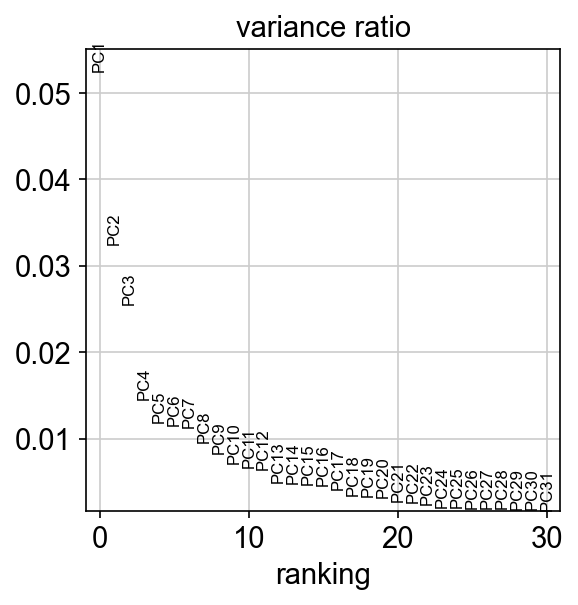

In [ ]:
warnings.filterwarnings("ignore")
#for obj in  [  Human_10x_PLF_1, Human_10x_NLF_1, Mouse_10x_NLF,  Human_Parse_PLF, Human_Parse_OLF, Human_Parse_Lamina, Human_Parse_OLFLamina ]:
for obj in  [  BR_OPLL_1, BR_OPLL_2, BR_OPLL_3 , BR_CSM_1 , BR_CSM_2   ]:   # Human_10x_PLF_1,  Human_10x_PLF_2,  Human_10x_NLF_1, Human_10x_NLF_2 
    print ("\n", obj.Sample_ID)
    obj.filter_manual ( min_genes = 500, min_cells = 30 )
    obj.filter_mito_manual ( threshold = 20, jitter = 0.4, visualization = False )
    obj.scrublet ()        # 이게 제일 오래걸린다
    obj.normalize ( target_sum = 10000 )
    obj.feature_selection_PCA ( n_top_genes = 0 )       # top_genes = 0   or 3000?
    obj.save_h5ad_preprocessing ()

---

### Clustering for individual 10x adata (with save)

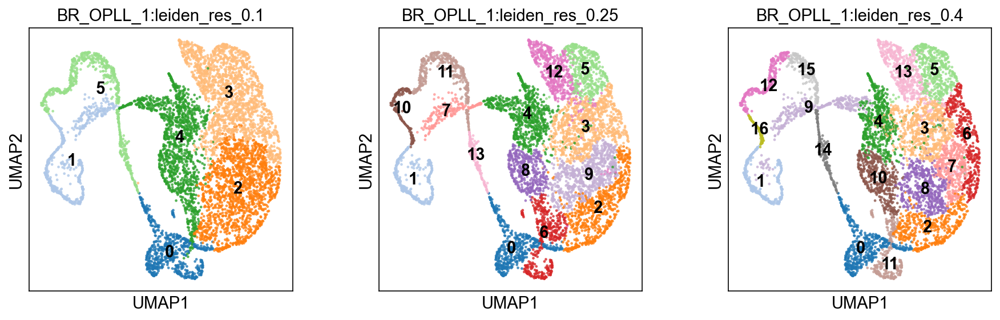

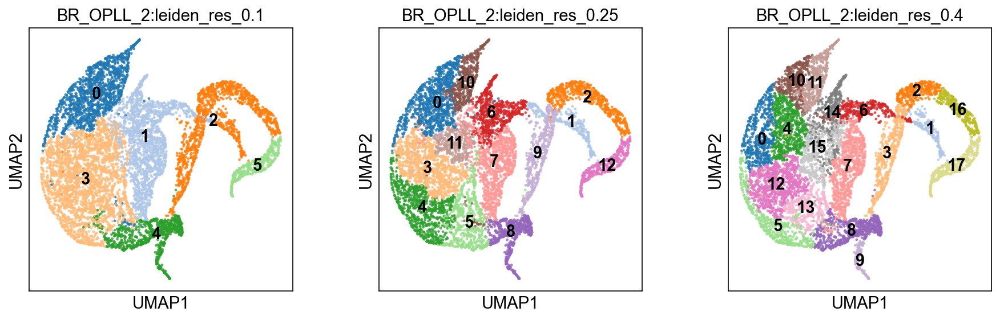

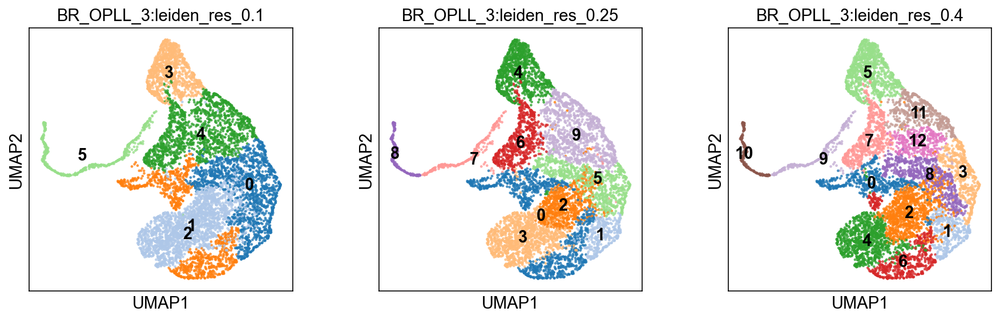

AttributeError: 'OBJECT' object has no attribute 'adata'

In [6]:
warnings.filterwarnings("ignore")
sc.set_figure_params ( dpi = 75,  facecolor="white" )
# Human_10x_PLF_1.clustering_leiden (n_neighbors = 30, n_pcs = 8, leiden_resolution = [0.1, 0.25, 0.4], dpi = 75, size = 20, alpha = 0.8, palette = tabl_20); Human_10x_PLF_1.cluster_name = "leiden_res_0.25"
# Human_10x_PLF_1.save_h5ad_clustered ()
# Human_10x_PLF_2.clustering_leiden (n_neighbors = 30, n_pcs = 8, leiden_resolution = [0.1, 0.25, 0.4], dpi = 75, size = 20, alpha = 0.8, palette = tabl_20); Human_10x_PLF_2.cluster_name = "leiden_res_0.25"
# Human_10x_PLF_2.save_h5ad_clustered ()
# Human_10x_NLF_1.clustering_leiden (n_neighbors = 20, n_pcs = 6, leiden_resolution = [0.1, 0.25, 0.4], dpi = 75, size = 20, alpha = 0.8, palette = tabl_20); Human_10x_NLF_1.cluster_name = "leiden_res_0.25"
# Human_10x_NLF_1.save_h5ad_clustered ()
# Human_10x_NLF_2.clustering_leiden (n_neighbors = 20, n_pcs = 6, leiden_resolution = [0.1, 0.25, 0.4], dpi = 75, size = 20, alpha = 0.8, palette = tabl_20); Human_10x_NLF_2.cluster_name = "leiden_res_0.25"
# Human_10x_NLF_2.save_h5ad_clustered ()

# Mouse_10x_NLF.clustering_leiden (n_neighbors = 20, n_pcs = 6, leiden_resolution = [0.1, 0.25, 0.4], dpi = 75, size = 20, alpha = 0.8, palette = tabl_20); Mouse_10x_NLF.cluster_name = "leiden_res_0.1"
# Mouse_10x_NLF.save_h5ad_clustered ()


# Human_10x_PLF.clustering_louvain (n_neighbors = 20, n_pcs = 10, louvain_resolution = [0.1, 0.25, 0.4, 0.6], dpi = 75, size = 20, alpha = 0.8, palette = tabl_20); Human_10x_PLF.cluster_name = "leiden_res_0.25"
# Human_10x_PLF.save_h5ad_clustered ()


# Human_10x_Femur.clustering_leiden (n_neighbors = 20, n_pcs = 6, leiden_resolution = [0.1, 0.25, 0.4], dpi = 75, size = 20, alpha = 0.8, palette = tabl_20); Human_10x_Femur.cluster_name = "leiden_res_0.25"
# Human_10x_Femur.save_h5ad_clustered ()
# Human_10x_Femur.adata.obs ['condition'] = Human_10x_Femur.adata.obs ['Sample'].apply(lambda x: 'OLF' if x in [ "Femur", "GSM6726761", "GSM6726767", "OLF" ] else "NLF" )

BR_OPLL_1.clustering_leiden (n_neighbors = 20, n_pcs = 6, leiden_resolution = [0.1, 0.25, 0.4], dpi = 75, size = 20, alpha = 0.8, palette = tabl_20); BR_OPLL_1.cluster_name = "leiden_res_0.25"
BR_OPLL_1.save_h5ad_clustered ()
BR_OPLL_2.clustering_leiden (n_neighbors = 20, n_pcs = 6, leiden_resolution = [0.1, 0.25, 0.4], dpi = 75, size = 20, alpha = 0.8, palette = tabl_20); BR_OPLL_2.cluster_name = "leiden_res_0.25"
BR_OPLL_2.save_h5ad_clustered ()
BR_OPLL_3.clustering_leiden (n_neighbors = 20, n_pcs = 6, leiden_resolution = [0.1, 0.25, 0.4], dpi = 75, size = 20, alpha = 0.8, palette = tabl_20); BR_OPLL_3.cluster_name = "leiden_res_0.25"
BR_OPLL_3.save_h5ad_clustered ()
BR_CSM_1.clustering_leiden (n_neighbors = 20, n_pcs = 6, leiden_resolution = [0.1, 0.25, 0.4], dpi = 75, size = 20, alpha = 0.8, palette = tabl_20); BR_CSM_1.cluster_name = "leiden_res_0.25"
BR_CSM_1.save_h5ad_clustered ()
BR_CSM_2.clustering_leiden (n_neighbors = 20, n_pcs = 6, leiden_resolution = [0.1, 0.25, 0.4], dpi = 75, size = 20, alpha = 0.8, palette = tabl_20); BR_CSM_2.cluster_name = "leiden_res_0.25"
BR_CSM_2.save_h5ad_clustered ()
 

---

## Load Data

- Preprocessing까지만 된 것 (Parse)

In [39]:
# Human_Parse_PLF = OBJECT ("Human_Parse_PLF")
# Human_Parse_PLF.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Human_Parse_PLF.preprocessing.h5ad" ) )
# Human_Parse_PLF.cluster_name = "leiden_res_0.25"

# Human_Parse_OLF = OBJECT ("Human_Parse_OLF")
# Human_Parse_OLF.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Human_Parse_OLF.preprocessing.h5ad" ) )
# Human_Parse_OLF.cluster_name = "leiden_res_0.25"

# Human_Parse_Lamina = OBJECT ("Human_Parse_Lamina")
# Human_Parse_Lamina.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Human_Parse_Lamina.preprocessing.h5ad" ) )
# Human_Parse_Lamina.cluster_name = "leiden_res_0.25"

# Human_Parse_OLFLamina = OBJECT ("Human_Parse_OLFLamina")
# Human_Parse_OLFLamina.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Human_Parse_OLFLamina.preprocessing.h5ad" ) )
# Human_Parse_OLFLamina.cluster_name = "leiden_res_0.25"

Cell * Gene : (2525, 5769)
Cell * Gene : (2570, 5589)
Cell * Gene : (964, 3832)
Cell * Gene : (3534, 4300)


- Clustering까지 된 것 (10X 및 others)

In [42]:
# Mouse_10x_NLF = OBJECT ("Mouse_10x_NLF")
# Mouse_10x_NLF.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Mouse_10x_NLF.clustered.h5ad" ) )
# Mouse_10x_NLF.cluster_name = "leiden_res_0.1"



# Human_10x_PLF_1 = OBJECT ("Human_10x_PLF_1")
# Human_10x_PLF_1.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Human_10x_PLF_1.clustered.h5ad" ) )
# Human_10x_PLF_1.cluster_name = "leiden_res_0.25"
# Human_10x_PLF_1.adata.obs ['condition'] = Human_10x_PLF_1.adata.obs ['Sample'].apply(lambda x: 'PLF' if 'PLF' in x else ('NLF' if 'NLF' in x else ''));

# Human_10x_PLF_2 = OBJECT ("Human_10x_PLF_2")
# Human_10x_PLF_2.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Human_10x_PLF_2.clustered.h5ad" ) )
# Human_10x_PLF_2.cluster_name = "leiden_res_0.25"
# Human_10x_PLF_2.adata.obs ['condition'] = Human_10x_PLF_2.adata.obs ['Sample'].apply(lambda x: 'PLF' if 'PLF' in x else ('NLF' if 'NLF' in x else ''));

# Human_10x_NLF_1 = OBJECT ("Human_10x_NLF_1")
# Human_10x_NLF_1.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Human_10x_NLF_1.clustered.h5ad" ) )
# Human_10x_NLF_1.cluster_name = "leiden_res_0.25"
# Human_10x_NLF_1.adata.obs ['condition'] = Human_10x_NLF_1.adata.obs ['Sample'].apply(lambda x: 'PLF' if 'PLF' in x else ('NLF' if 'NLF' in x else ''));

# Human_10x_NLF_2 = OBJECT ("Human_10x_NLF_2")
# Human_10x_NLF_2.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Human_10x_NLF_2.clustered.h5ad" ) )
# Human_10x_NLF_2.cluster_name = "leiden_res_0.25"
# Human_10x_NLF_2.adata.obs ['condition'] = Human_10x_NLF_2.adata.obs ['Sample'].apply(lambda x: 'PLF' if 'PLF' in x else ('NLF' if 'NLF' in x else ''));



# Human_10x_Femur = OBJECT ("Human_10x_Femur")
# Human_10x_Femur.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Human_10x_Femur.clustered.h5ad" ) )
# Human_10x_Femur.cluster_name = "leiden_res_0.25"

Cell * Gene : (11088, 2939)
Cell * Gene : (8058, 3319)
Cell * Gene : (13395, 3116)
Cell * Gene : (16126, 2921)
Cell * Gene : (21201, 3020)
Cell * Gene : (14075, 3000)


---

## Integrate (Batch effect removal)

### BBKNN for Parse data (with save)

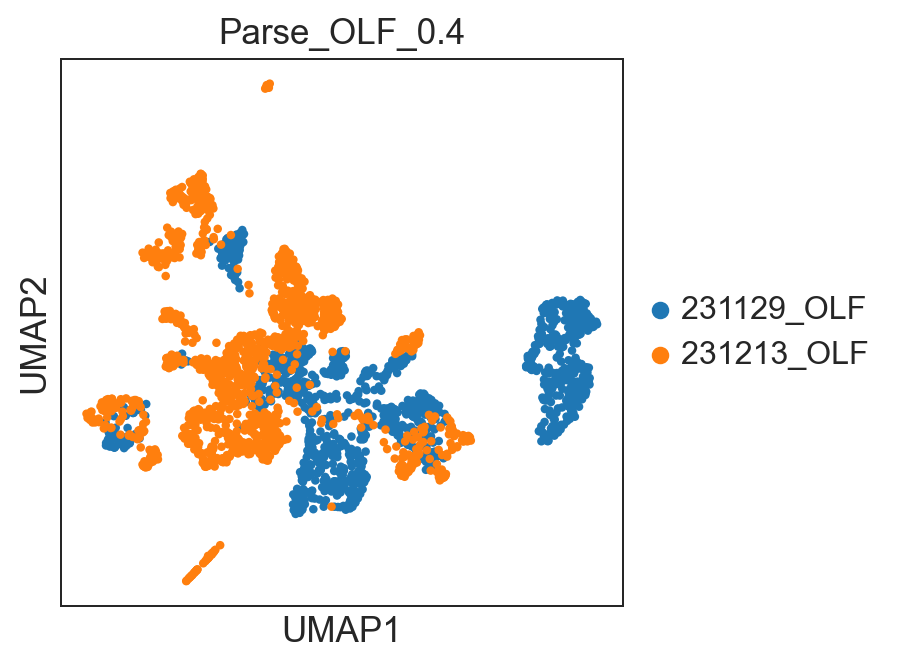

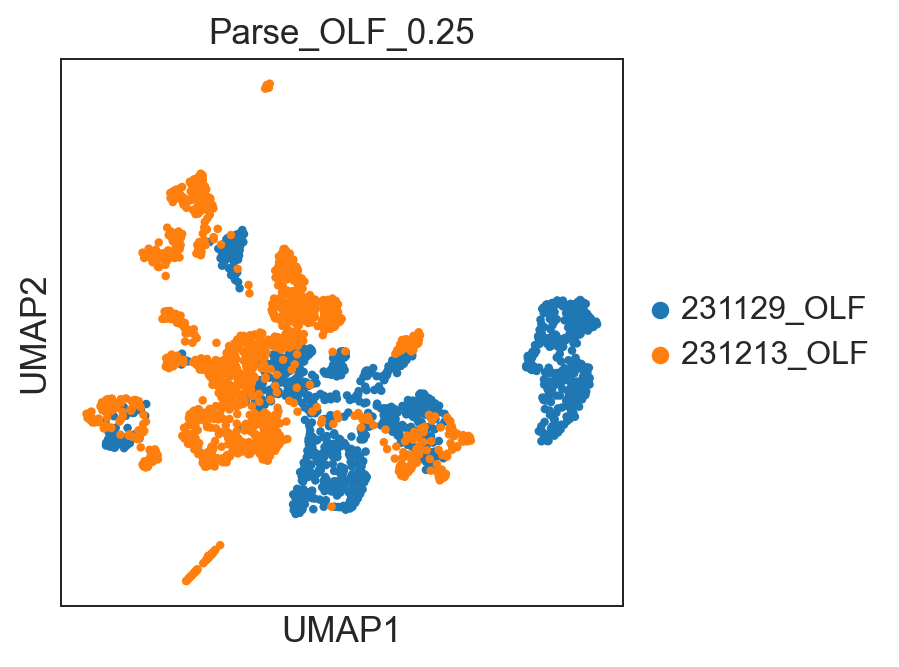

In [34]:
warnings.filterwarnings("ignore")
def INTEGRATE_BBKNN ( obj, leiden_resolution, ID ):
    sc.external.pp.bbknn(obj.adata, batch_key = "sample")        ## bbknn으로 합친 다음에 clustering 한다
    sc.pp.neighbors( obj.adata )
    sc.tl.umap( obj.adata )
    sc.tl.leiden( obj.adata, key_added="leiden_res_{}".format ( leiden_resolution ), resolution = leiden_resolution, flavor = "igraph"   )    # resolution을 각각에 대해서 수행하고,  key를 붙여줌
    sc.settings.figdir = "/data/project/OPLL/02.scRNA/script/scanpy/figures/{}/".format (obj.Sample_ID) 
    sc.pl.umap( obj.adata, color = [ "sample" ], title = ID, save = ":Integrated_01-1.Clustering.{}.png".format (ID) )
    obj.adata.write( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated.{}.clustered.h5ad".format (ID) )
    #sc.external.pp.harmony_integrate (obj.adata, key = "sample")
    #sc.external.pp.scanorama_integrate (obj.adata, key = "sample")
    # sc.pp.neighbors( obj.adata, use_rep = "X_scanorama")

    return obj


# Human_Parse_PLF_4 = INTEGRATE_BBKNN  ( obj = Human_Parse_PLF,  leiden_resolution = 0.4, ID = "Parse_PLF_0.4" ); Human_Parse_PLF_4.cluster_name = "leiden_res_0.4"; Human_Parse_PLF_4.adata.obs ['condition'] = Human_Parse_PLF_4.adata.obs ['sample'].apply(lambda x: 'PLF' if 'PLF' in x else ('PLF' if 'PLF' in x else ''))
# Human_Parse_PLF_25 = INTEGRATE_BBKNN  ( obj = Human_Parse_PLF, leiden_resolution = 0.25, ID = "Parse_PLF_0.25" ); Human_Parse_PLF_25.cluster_name = "leiden_res_0.25"; Human_Parse_PLF_25.adata.obs ['condition'] = Human_Parse_PLF_25.adata.obs ['sample'].apply(lambda x: 'PLF' if 'PLF' in x else ('PLF' if 'PLF' in x else ''))

Human_Parse_OLF_4 = INTEGRATE_BBKNN  ( obj = Human_Parse_OLF, leiden_resolution = 0.4, ID = "Parse_OLF_0.4" ); Human_Parse_OLF_4.cluster_name = "leiden_res_0.4"; Human_Parse_OLF_4.adata.obs ['condition'] = Human_Parse_OLF_4.adata.obs ['sample'].apply(lambda x: 'OLF' if 'OLF' in x else ('Lamina' if 'Lamina' in x else ''))
Human_Parse_OLF_25 = INTEGRATE_BBKNN  ( obj = Human_Parse_OLF, leiden_resolution = 0.25, ID = "Parse_OLF_0.25" ); Human_Parse_OLF_25.cluster_name = "leiden_res_0.25"; Human_Parse_OLF_25.adata.obs ['condition'] = Human_Parse_OLF_25.adata.obs ['sample'].apply(lambda x: 'OLF' if 'OLF' in x else ('Lamina' if 'Lamina' in x else ''))
#Human_Parse_231213_OLF_25 = INTEGRATE_BBKNN  ( obj = Human_Parse_231213_OLF, leiden_resolution = 0.25, ID = "Parse_OLF_231213_0.25" ); Human_Parse_231213_OLF_25.cluster_name = "leiden_res_0.25"; Human_Parse_231213_OLF_25.adata.obs ['condition'] = Human_Parse_231213_OLF_25.adata.obs ['sample'].apply(lambda x: 'OLF' if 'OLF' in x else ('Lamina' if 'Lamina' in x else ''))


# Human_Parse_Lamina_4 = INTEGRATE_BBKNN  ( obj = Human_Parse_Lamina, leiden_resolution = 0.4, ID = "Parse_Lamina_0.4" ); Human_Parse_Lamina_4.cluster_name = "leiden_res_0.4"; Human_Parse_Lamina_4.adata.obs ['condition'] = Human_Parse_Lamina_4.adata.obs ['sample'].apply(lambda x: 'OLF' if 'OLF' in x else ('Lamina' if 'Lamina' in x else ''))
# Human_Parse_Lamina_25 = INTEGRATE_BBKNN  ( obj = Human_Parse_Lamina, leiden_resolution = 0.25, ID = "Parse_Lamina_0.25" ); Human_Parse_Lamina_25.cluster_name = "leiden_res_0.25"; Human_Parse_Lamina_25.adata.obs ['condition'] = Human_Parse_Lamina_25.adata.obs ['sample'].apply(lambda x: 'OLF' if 'OLF' in x else ('Lamina' if 'Lamina' in x else ''))

# Human_Parse_OLFLamina_4 = INTEGRATE_BBKNN  ( obj = Human_Parse_OLFLamina, leiden_resolution = 0.4, ID = "Parse_OLFLamina_0.4" ); Human_Parse_OLFLamina_4.cluster_name = "leiden_res_0.4"; Human_Parse_OLFLamina_4.adata.obs ['condition'] = Human_Parse_OLFLamina_4.adata.obs ['sample'].apply(lambda x: 'OLF' if 'OLF' in x else ('Lamina' if 'Lamina' in x else ''))
# Human_Parse_OLFLamina_25 = INTEGRATE_BBKNN  ( obj = Human_Parse_OLFLamina, leiden_resolution = 0.25, ID = "Parse_OLFLamina_0.25" ); Human_Parse_OLFLamina_25.cluster_name = "leiden_res_0.25"; Human_Parse_OLFLamina_25.adata.obs ['condition'] = Human_Parse_OLFLamina_25.adata.obs ['sample'].apply(lambda x: 'OLF' if 'OLF' in x else ('Lamina' if 'Lamina' in x else ''))

### Scanorama (with save)

Found 1239 genes among all datasets
[[0.         0.61131794 0.65413254 0.45035989]
 [0.         0.         0.53773796 0.47965659]
 [0.         0.         0.         0.54750093]
 [0.         0.         0.         0.        ]]
Processing datasets (0, 2)
Processing datasets (0, 1)
Processing datasets (2, 3)
Processing datasets (1, 2)
Processing datasets (1, 3)
Processing datasets (0, 3)


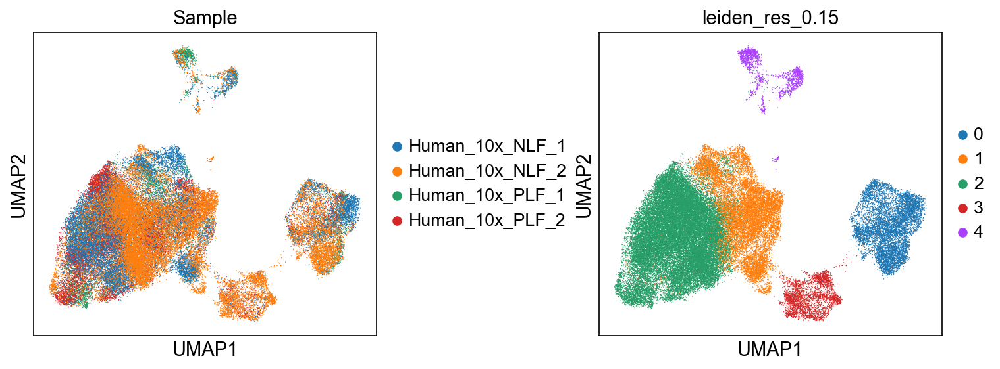

Cell * Gene : (58780, 1239)


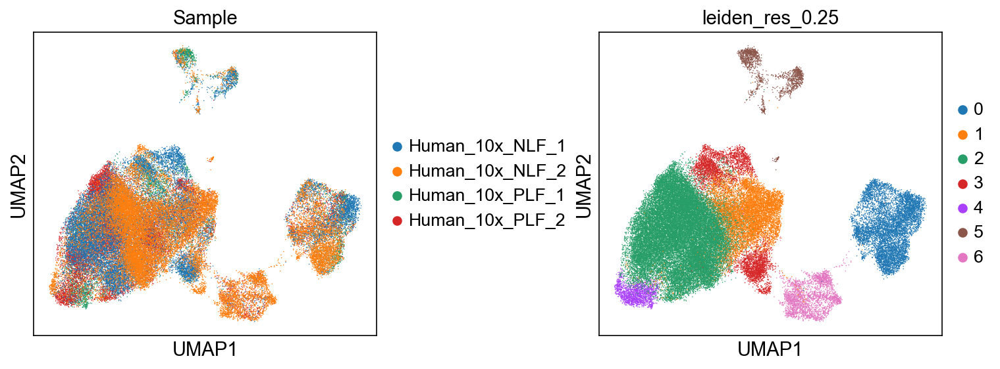

Cell * Gene : (58780, 1239)


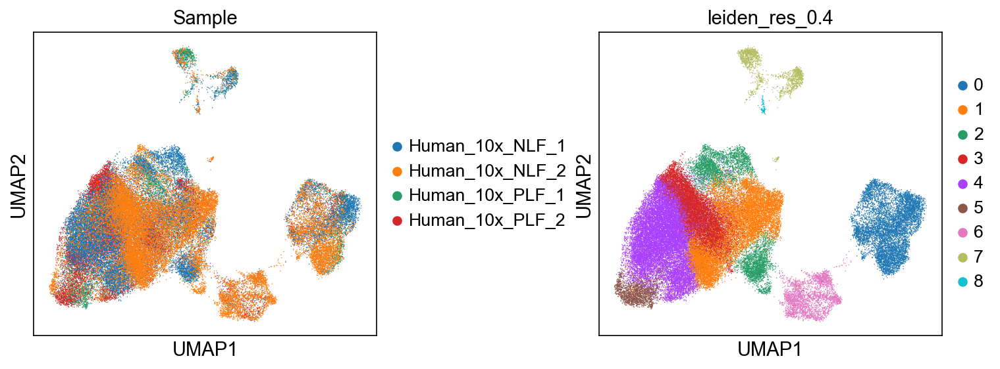

Cell * Gene : (58780, 1239)


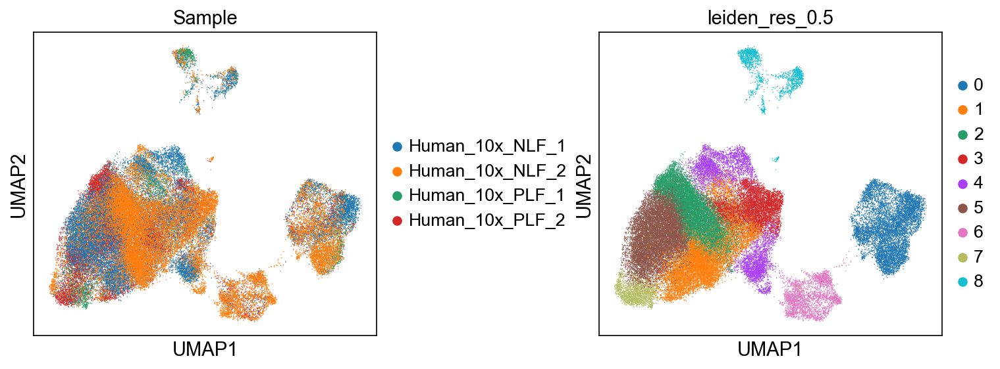

Cell * Gene : (58780, 1239)


In [7]:
warnings.filterwarnings("ignore")
def INTEGRATE_SCANORAMA ( datas ):
    import scanorama, anndata
    # Batch correction + Integration. : 2분 이상 걸림
    corrected = scanorama.correct_scanpy ( datas, return_dimred = True )
    Integrated_adata = sc.concat( corrected )
    Integrated_adata.obsm["Scanorama"] = np.concatenate( [data.obsm['X_scanorama'] for data in corrected ] )
    Integrated_adata.var_names_make_unique()
    Integrated_adata.obs_names_make_unique()
    # layer층을 복사해줘야 scvelo, celloracle이 가능
    Integrated_adata.layers = anndata.concat( datas ).layers.copy()
    return Integrated_adata

def CLUSTER_SCANORAMA ( Integrated_adata, leiden_resolution, ID, cluster_name ):
    sc.pp.neighbors( Integrated_adata, use_rep = "Scanorama")
    sc.tl.umap( Integrated_adata )
    sc.tl.leiden( Integrated_adata, key_added = "leiden_res_{}".format( leiden_resolution ), resolution = leiden_resolution, flavor = "igraph"   )    # resolution을 각각에 대해서 수행하고,  key를 붙여줌
    sc.settings.figdir = "/data/project/OPLL/02.scRNA/script/scanpy/figures/{}/".format (ID) 
    if not os.path.exists ( sc.settings.figdir ):
        os.makedirs ( sc.settings.figdir )
    sc.pl.umap( Integrated_adata, color = ['Sample', cluster_name ], save = ":{}_01-1.Clustering.png".format (ID) , wspace = 0.5 )
    
    Integrated_adata.write( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/{}.clustered.h5ad".format (ID) )
    Integrated = OBJECT ( "{}".format (ID) )
    Integrated.input_from_adata ( Integrated_adata )     # Integrated_adata_10x
    
    return Integrated



Integrated_adata = INTEGRATE_SCANORAMA  ( datas = [ Human_10x_PLF_1.adata, Human_10x_PLF_2.adata, Human_10x_NLF_1.adata, Human_10x_NLF_2.adata ] )
Integrated_10x_15 = CLUSTER_SCANORAMA ( Integrated_adata, leiden_resolution = 0.15, ID = "Integrated_10x_0.15", cluster_name = "leiden_res_0.15" ); Integrated_10x_15.cluster_name = "leiden_res_0.15"; Integrated_10x_15.adata.obs ['condition'] = Integrated_10x_15.adata.obs ['Sample'].apply(lambda x: 'PLF' if 'PLF' in x else ('NLF' if 'NLF' in x else ''));   Integrated_10x_15.adata.write( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_10x_0.15.clustered.h5ad" )
Integrated_10x_25 = CLUSTER_SCANORAMA ( Integrated_adata, leiden_resolution = 0.25, ID = "Integrated_10x_0.25", cluster_name = "leiden_res_0.25" ); Integrated_10x_25.cluster_name = "leiden_res_0.25"; Integrated_10x_25.adata.obs ['condition'] = Integrated_10x_25.adata.obs ['Sample'].apply(lambda x: 'PLF' if 'PLF' in x else ('NLF' if 'NLF' in x else ''));   Integrated_10x_25.adata.write( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_10x_0.25.clustered.h5ad" )
Integrated_10x_4 = CLUSTER_SCANORAMA ( Integrated_adata, leiden_resolution = 0.4, ID = "Integrated_10x_0.4", cluster_name = "leiden_res_0.4" ); Integrated_10x_4.cluster_name = "leiden_res_0.4"; Integrated_10x_4.adata.obs ['condition'] = Integrated_10x_4.adata.obs ['Sample'].apply(lambda x: 'PLF' if 'PLF' in x else ('NLF' if 'NLF' in x else ''));   Integrated_10x_4.adata.write( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_10x_0.4.clustered.h5ad" )
Integrated_10x_5 = CLUSTER_SCANORAMA ( Integrated_adata, leiden_resolution = 0.5, ID = "Integrated_10x_0.5", cluster_name = "leiden_res_0.5" ); Integrated_10x_5.cluster_name = "leiden_res_0.5"; Integrated_10x_5.adata.obs ['condition'] = Integrated_10x_5.adata.obs ['Sample'].apply(lambda x: 'PLF' if 'PLF' in x else ('NLF' if 'NLF' in x else ''));   Integrated_10x_5.adata.write( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_10x_0.5.clustered.h5ad" )

# Integrated_adata = INTEGRATE_SCANORAMA  ( datas = [ Human_10x_PLF_1.adata, Human_10x_PLF_2.adata, Human_10x_NLF_1.adata, Human_10x_NLF_2.adata, Mouse_10x_NLF.adata] )
# Integrated_10x_human_mouse_4 = CLUSTER_SCANORAMA ( Integrated_adata, leiden_resolution = 0.4, ID = "Integrated_10x_human_mouse_0.4", cluster_name = "leiden_res_0.4" ); Integrated_10x_human_mouse_4.cluster_name = "leiden_res_0.4"; Integrated_10x_human_mouse_4.adata.obs ['condition'] = Integrated_10x_human_mouse_4.adata.obs ['Sample'].apply(lambda x: 'PLF' if 'PLF' in x else ('NLF' if 'NLF' in x else ''));   Integrated_10x_human_mouse_4.adata.write( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_10x_human_mouse_0.4.clustered.h5ad" )
# Integrated_10x_human_mouse_25 = CLUSTER_SCANORAMA ( Integrated_adata, leiden_resolution = 0.25, ID = "Integrated_10x_human_mouse_0.25", cluster_name = "leiden_res_0.25" ); Integrated_10x_human_mouse_25.cluster_name = "leiden_res_0.25"; Integrated_10x_human_mouse_25.adata.obs ['condition'] = Integrated_10x_human_mouse_25.adata.obs ['Sample'].apply(lambda x: 'PLF' if 'PLF' in x else ('NLF' if 'NLF' in x else ''));   Integrated_10x_human_mouse_25.adata.write( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_10x_human_mouse_0.25.clustered.h5ad" )

# Integrated_adata = INTEGRATE_SCANORAMA  ( datas = [ Human_10x_Femur.adata,  Human_10x_PLF_1.adata, Human_10x_PLF_2.adata, Human_10x_NLF_1.adata, Human_10x_NLF_2.adata] )
# Integrated_10x_public_4 = CLUSTER_SCANORAMA ( Integrated_adata, leiden_resolution = 0.4, ID = "Integrated_10x_public_0.4", cluster_name = "leiden_res_0.4" ); Integrated_10x_public_4.cluster_name = "leiden_res_0.4"; Integrated_10x_public_4.adata.obs ['condition'] = Integrated_10x_public_4.adata.obs ['Sample'].apply(lambda x: 'PLF' if 'PLF' in x else ('NLF' if 'NLF' in x else 'OLF'));   Integrated_10x_public_4.adata.write( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_10x_public_0.4.clustered.h5ad" )
# Integrated_10x_public_25 = CLUSTER_SCANORAMA ( Integrated_adata, leiden_resolution = 0.25, ID = "Integrated_10x_public_0.25", cluster_name = "leiden_res_0.25" ); Integrated_10x_public_25.cluster_name = "leiden_res_0.25"; Integrated_10x_public_25.adata.obs ['condition'] = Integrated_10x_public_25.adata.obs ['Sample'].apply(lambda x: 'PLF' if 'PLF' in x else ('NLF' if 'NLF' in x else 'OLF'));   Integrated_10x_public_25.adata.write( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_10x_public_0.25.clustered.h5ad" )

# Integrated_adata = INTEGRATE_SCANORAMA  ( datas = [ Human_Parse_OLF.adata,  Human_10x_PLF_1.adata, Human_10x_PLF_2.adata, Human_10x_NLF_1.adata, Human_10x_NLF_2.adata] )
# Integrated_10x_parse_4 = CLUSTER_SCANORAMA ( Integrated_adata, leiden_resolution = 0.4, ID = "Integrated_10x_parse_0.4", cluster_name = "leiden_res_0.4" ); Integrated_10x_parse_4.cluster_name = "leiden_res_0.4"; Integrated_10x_parse_4.adata.obs ['condition'] = Integrated_10x_parse_4.adata.obs ['Sample'].apply(lambda x: 'PLF' if 'PLF' in x else ('NLF' if 'NLF' in x else 'OLF'));   Integrated_10x_parse_4.adata.write( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_10x_parse_0.4.clustered.h5ad" )
# Integrated_10x_parse_25 = CLUSTER_SCANORAMA ( Integrated_adata, leiden_resolution = 0.25, ID = "Integrated_10x_parse_0.25", cluster_name = "leiden_res_0.25" ); Integrated_10x_parse_25.cluster_name = "leiden_res_0.25"; Integrated_10x_parse_25.adata.obs ['condition'] = Integrated_10x_parse_25.adata.obs ['Sample'].apply(lambda x: 'PLF' if 'PLF' in x else ('NLF' if 'NLF' in x else 'OLF'));   Integrated_10x_parse_25.adata.write( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_10x_parse_0.25.clustered.h5ad" )

---

## Load Data (after integration)

In [4]:
### Integration by BBKNN (Parse)

# Human_Parse_OLF_4 = OBJECT ("Parse_OLF_0.4")
# Human_Parse_OLF_4.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Human_Parse_OLF_0.4.clustered.h5ad" ) )
# Human_Parse_OLF_4.cluster_name = "leiden_res_0.4"

# Human_Parse_OLF_25 = OBJECT ("Parse_OLF_0.25")
# Human_Parse_OLF_4.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Human_Parse_OLF_0.25.clustered.h5ad" ) )
# Human_Parse_OLF_4.cluster_name = "leiden_res_0.25"

# Human_Parse_PLF_4
# Human_Parse_PLF_25
# Human_Parse_Lamina_4
# Human_Parse_Lamina_25



### Integration by Scanorama (10x)
Integrated_10x_4 = OBJECT ("Integrated_10x_0.4")
Integrated_10x_4.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_10x_0.4.clustered.h5ad" ) )
Integrated_10x_4.cluster_name = "leiden_res_0.4"
Integrated_10x_25 = OBJECT ("Integrated_10x_0.25")
Integrated_10x_25.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_10x_0.25.clustered.h5ad" ) )
Integrated_10x_25.cluster_name = "leiden_res_0.25"
# Integrated_10x_human_mouse_25 = OBJECT ("Integrated_10x_human_mouse_0.25")
# Integrated_10x_human_mouse_25.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_10x_human_mouse_0.25.clustered.h5ad" ) )
# Integrated_10x_human_mouse_25.cluster_name = "leiden_res_0.25"

# Integrated_all_4 = OBJECT ("Integrated_all_0.4")
# Integrated_all_4.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_all_0.4.clustered.h5ad" ) )
# Integrated_all_4.cluster_name = "leiden_res_0.4"
# Integrated_all_25 = OBJECT ("Integrated_all_0.25")
# Integrated_all_25.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_all_0.25.clustered.h5ad" ) )
# Integrated_all_25.cluster_name = "leiden_res_0.25"


# Integrated_10x_public_25 = OBJECT ("Integrated_10x_public_0.25")
# Integrated_10x_public_25.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_10x_public_0.25.clustered.h5ad" ) )
# Integrated_10x_public_25.cluster_name = "leiden_res_0.25"

# Integrated_10x_parse231213_25 = OBJECT ("Integrated_10x_parse231213_0.25")
# Integrated_10x_parse231213_25.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_10x_parse231213_0.25.clustered.h5ad" ) )
# Integrated_10x_parse231213_25.cluster_name = "leiden_res_0.25"

# Integrated_10x_parse231213_25 = OBJECT ("Integrated_10x_parse231213_0.25")
# Integrated_10x_parse231213_25.input_from_adata ( sc.read_h5ad ( "/data/project/OPLL/02.scRNA/script/scanpy/AnnData/Integrated_10x_parse231213_0.25.clustered.h5ad" ) )
# Integrated_10x_parse231213_25.cluster_name = "leiden_res_0.25"

Cell * Gene : (60964, 1198)


---

# Downstream analysis

Sample_ID = BR_OPLL_1	clustering_name = leiden_res_0.25
Sample
BR_OPLL_1    5802
Name: n_genes, dtype: int64


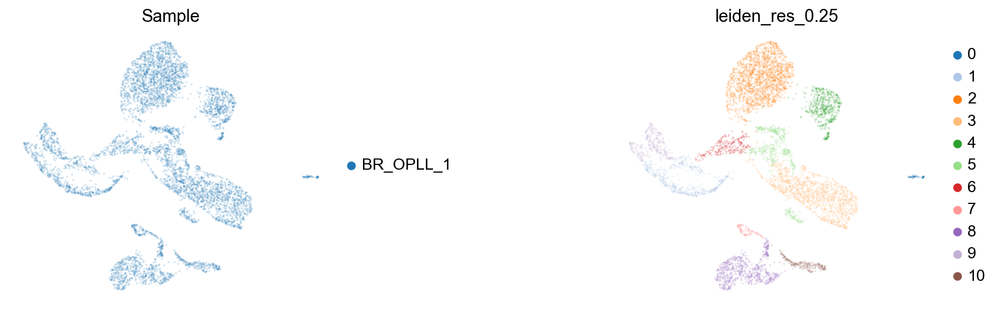

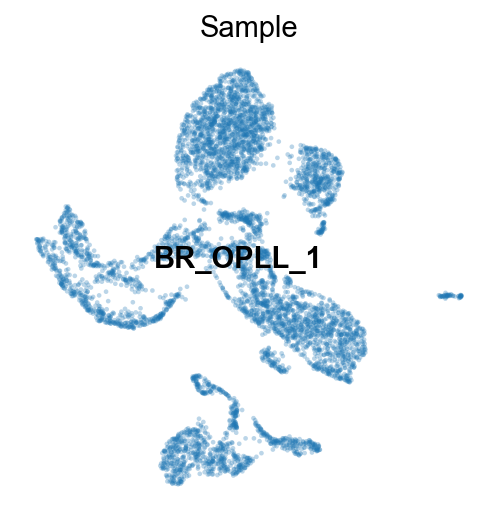

In [10]:
#obj = Integrated_10x_parse_25  #  Integrated_10x_25, Integrated_10x_human_mouse_25,  Integrated_10x_4
obj = BR_OPLL_1
print ( "Sample_ID = {}\tclustering_name = {}".format (obj.Sample_ID, obj.cluster_name ))
print ( obj.adata.obs.groupby ("Sample").count ()["n_genes"] )
sc.set_figure_params ( dpi = 75,  facecolor="white" )
sc.settings.figdir = "/data/project/OPLL/02.scRNA/script/scanpy/figures/{}/".format (obj.Sample_ID) 
sc.pl.umap ( obj.adata, color = [ "Sample", "condition", obj.cluster_name ], s = 10, alpha = 0.2, wspace = 0.7,  frameon=False, ncols = 5, cmap = my_cmap,   save = ":" + obj.Sample_ID + "_01-2.Clustering.png"  ) # legend_loc = "on data"

# sc.pl.umap ( obj.adata, color = [ "Sample", "condition", obj.cluster_name ], s = 20, alpha = 0.3, frameon=False, ncols = 5, cmap = my_cmap, legend_loc = "on data",   save = ":" + obj.Sample_ID + "_01-2.Clustering.png"  ) # legend_loc = "on data"
for Sample_of_interest in set ( obj.adata .obs["Sample"] ):
    sc.pl.umap ( obj.adata [ obj.adata .obs["Sample"].isin ( [ Sample_of_interest ]) ] , color = [ "Sample" ], s = 20, alpha = 0.3, frameon=False, ncols = 4, cmap = my_cmap, legend_loc = "on data"  ) # legend_loc = "on data"

### DEG 및 Marker Gene

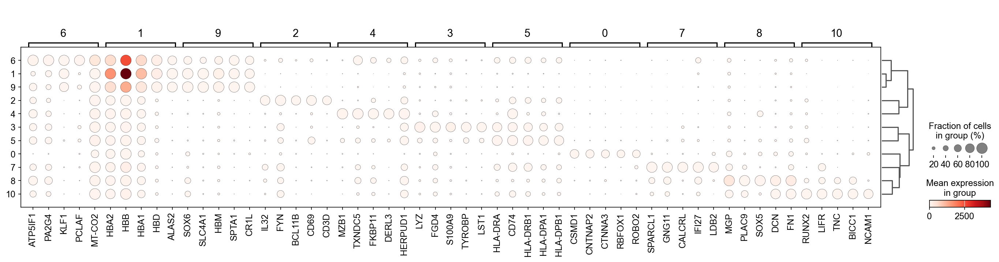

In [11]:
obj.find_marker_genes()

marker_gene_interest_list = [ "Osteoblast", "Chondrocyte", "Fibroblasts",  "TSPC", "CD8+ T cells"]
marker_gene_interest_dict = {}
for key, value in obj.adata.marker_genes.items():
    if key in marker_gene_interest_list:
        marker_gene_interest_dict [key] = value

# Find DEG
sc.tl.rank_genes_groups( obj.adata, groupby= obj.cluster_name, pts = True, method = "wilcoxon", key_added = "wilcoxon")
sc.tl.rank_genes_groups( obj.adata, groupby= obj.cluster_name, pts = True,  method = "t-test", key_added = "t-test")
sc.pl.rank_genes_groups_dotplot(  obj.adata, groupby= obj.cluster_name, key = "wilcoxon", n_genes = 5, save = ":" + obj.Sample_ID + "_02-1.Marker_gene.png", return_fig = False ) #  standard_scale="var", 

# marker gene의 발현 정도
#sc.pl.dotplot( obj.adata, marker_gene_interest_dict, groupby =  obj.cluster_name, dendrogram = True, title = obj.Sample_ID + "_" +  obj.cluster_name, save = ":" + obj.Sample_ID + "_02-1.Marker_gene.png")

## decoupler: ORA/Pathway/TF/GSEA using multiple database

In [14]:
import decoupler as dc
def RESULTS_ORA ( obj  ):
    acts = dc.get_acts( obj.adata, obsm_key = 'ora_estimate')
    acts_v = acts.X.ravel()
    max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
    acts.X[~np.isfinite(acts.X)] = max_e

    # Plot
    sc.set_figure_params ( dpi = 80,  facecolor="white" )
    sc.pl.umap(acts, color = [ 'Sample' ], palette = vivid_10, ncols = 2, wspace = 0.5  )      # 'condition'
    sc.pl.umap(acts, color = [ obj.cluster_name ], palette = tabl_20,  legend_loc = "on data"  )

    # df
    df = dc.rank_sources_groups(acts, groupby =  obj.cluster_name , reference = 'rest', method = 't-test_overestim_var')
    return df, acts

def DECOUPLER_PangaloDB ( obj, cluster_of_interest = [ "B cells", "Basophils", "Chondrocytes", "Embryonic stem cells", "Endothelial cells", "Erythroblasts", "Fibroblasts",  "Hematopoietic stem cells", "Macrophages", "Monocytes", "Myocytes", "NK cells", "Osteoblasts", "Osteoclasts", "Osteocytes", "Platelets", "Pluripotent stem cells", "T cells", "Vascular smooth muscle cells"] ):
    PangaloDB = dc.get_resource('PanglaoDB') 
    #set ( PangaloDB ["cell_type"].tolist() )
    PangaloDB = PangaloDB [ PangaloDB[ "canonical_marker" ] == True ]
    PangaloDB = PangaloDB [ PangaloDB["cell_type"].isin ( cluster_of_interest  ) ]
    PangaloDB = PangaloDB[~PangaloDB.duplicated(['cell_type', 'genesymbol']) ]   # Remove duplicated entries
    PangaloDB = PangaloDB [ ['cell_type', 'genesymbol'] ]

    #TSPC marker는 안 알려졌으니까 따로 붙여주자
    s1 = pd.core.series.Series ( ["NES", "SCX", "CD146", "CD44", "CD90", "CD29", "CD105", "TPPP3", "PDGFRA", "CD34", "TNMD", "SCA1", "FMOD", "MKX", "THBS4"] )    
    s2 = pd.core.series.Series ( ["TSPC"] * len (s1) )
    TSPC_marker_df = pd.DataFrame ( data = dict(genesymbol = s1, cell_type = s2 ) )

    PangaloDB = pd.concat ( [PangaloDB, TSPC_marker_df] ).reset_index ( drop = True)

    dc.run_ora(mat = obj.adata, net = PangaloDB, source = 'cell_type', target = 'genesymbol', verbose=True, use_raw = False )
    source = 'cell_type'
    return obj, PangaloDB, source

def DECOUPLER_CellTypist (obj):
    CellTypist = dc.get_resource('CellTypist')     # "collection" column을 보면 BP인지 hallmark인지 가져올 수 있다
    CellTypist = CellTypist[~CellTypist.duplicated(['cell_type', 'genesymbol'])]   # Remove duplicated entries
    dc.run_ora(mat = obj.adata, net = CellTypist, source = 'cell_type', target = 'genesymbol', verbose=True, use_raw = False )
    source = 'cell_type'
    return obj, CellTypist, source

def DECOUPLER_MSIGDB (obj):
    msigdb = dc.get_resource('MSigDB')     # "collection" column을 보면 BP인지 hallmark인지 가져올 수 있다
    msigdb = msigdb[msigdb['collection'] == 'go_biological_process']
    msigdb = msigdb[~msigdb.duplicated(['geneset', 'genesymbol'])]   # Remove duplicated entries
    dc.run_ora(mat = obj.adata, net = msigdb, source = 'geneset', target = 'genesymbol', verbose=True, use_raw = False )
    source = 'geneset'
    return obj, msigdb, source

def gmt_to_decoupler(pth: Path) -> pd.DataFrame:        
    from itertools import chain, repeat
    pathways = {}
    with Path(pth).open("r") as f:
        for line in f:
            name, _, *genes = line.strip().split("\t")
            pathways[name] = genes

    df_gmt = pd.DataFrame.from_records(
                chain.from_iterable(zip(repeat(k), v) for k, v in pathways.items()),
                columns=["geneset", "genesymbol"],
            ).reset_index (drop = True)
    source = "geneset"
    return df_gmt, source

Running ora on mat with 5802 samples and 4385 targets for 16 sources.


100%|██████████| 5802/5802 [00:05<00:00, 1021.88it/s]


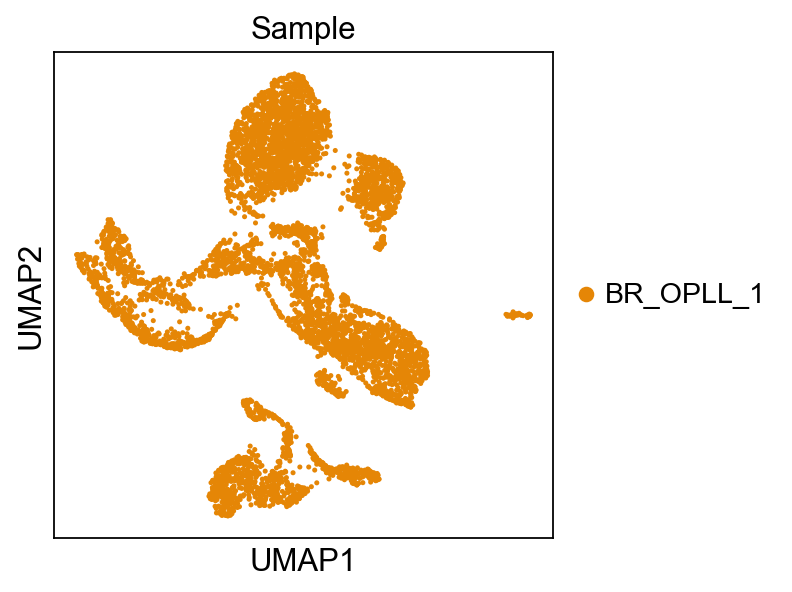

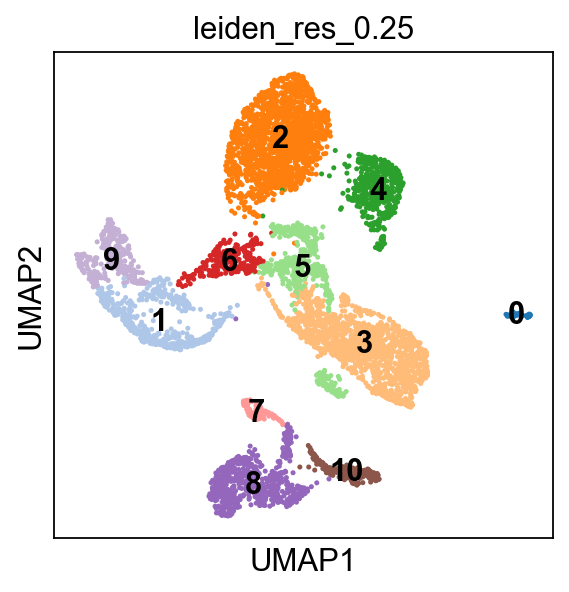

,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,0,rest,Osteoblasts,-1.877750,-0.533435,6.581190e-02,6.581190e-02
1,0,rest,TSPC,-1.980188,-0.293089,5.275999e-02,5.627732e-02
16,1,rest,Erythroblasts,40.501453,5.244602,2.936986e-207,4.699178e-206
17,1,rest,Basophils,4.540533,0.426061,6.345513e-06,8.460684e-06
32,10,rest,Osteoblasts,24.173974,7.222547,5.784852e-64,9.255764e-63
33,10,rest,Chondrocytes,8.628443,1.728447,2.489117e-16,1.261465e-15
48,2,rest,T cells,99.381257,14.076958,0.000000e+00,0.000000e+00
49,2,rest,NK cells,54.130313,12.248218,0.000000e+00,0.000000e+00
64,3,rest,Monocytes,56.606068,7.486467,0.000000e+00,0.000000e+00
65,3,rest,Macrophages,40.407033,9.967185,2.003373e-260,1.602698e-259


In [15]:
import decoupler as dc
dc.show_resources()

obj, df_gmt, source = DECOUPLER_PangaloDB ( obj, cluster_of_interest = [ "B cells", "Basophils", "Chondrocytes", "Embryonic stem cells", "Endothelial cells", "Erythroblasts", "Fibroblasts",  "Hematopoietic stem cells", "Macrophages", "Monocytes", "Myocytes", "NK cells", "Osteoblasts", "Osteoclasts", "Osteocytes", "Platelets", "Pluripotent stem cells", "T cells", "Vascular smooth muscle cells"] )
#obj, df_gmt, source = DECOUPLER_CellTypist ( obj )
#obj, df_gmt, source = DECOUPLER_MSIGDB ( obj )
# df_gmt, source = gmt_to_decoupler( "/data/project/OPLL/c5.go.bp.v2023.2.Hs.symbols.gmt" )      # c5bp
# df_gmt, source = gmt_to_decoupler( "/data/project/OPLL/02.scRNA/script/scanpy/c2.cp.reactome.v7.5.1.symbols.gmt" )      # Reactome

df, acts = RESULTS_ORA (obj)
df.groupby('group').head(2).to_csv (  obj.SavePATH.replace("AnnData", "manual_annotation_df") + "/{}.tsv".format (obj.Sample_ID), sep = "\t", index = False )
df.groupby('group').head(2)

### Manual annotation (with save)

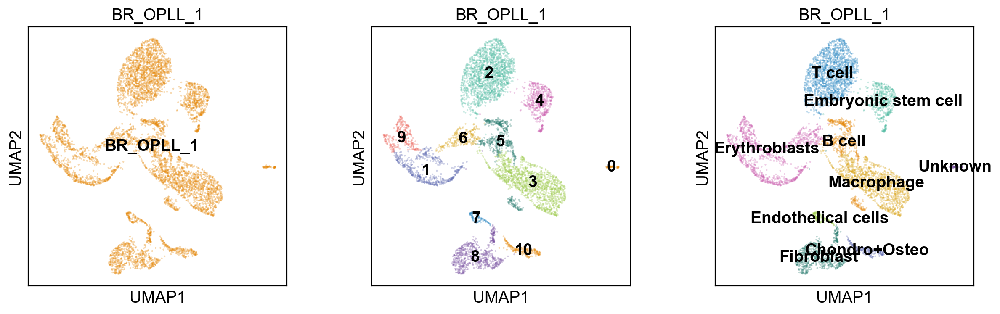

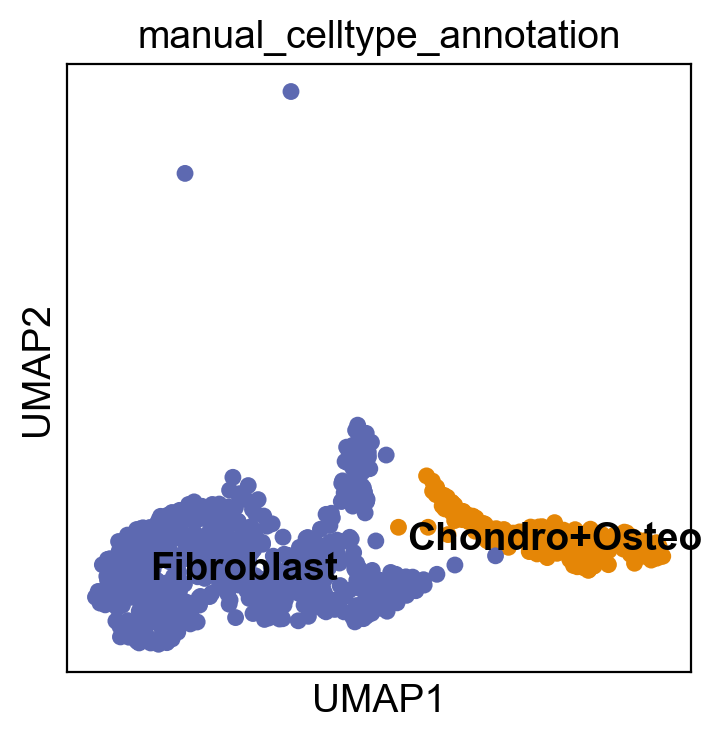

In [18]:
################################################ INTEGRATED SAMPLE ################################################

## Manual annotation (Integrated_10x_4)
cl_annotation = { "1": "Fibroblast", "2": "Fibroblast", "3": "Fibroblast", "4": "Chondrocyte",  "5" : "Chondro+Osteo",  "0": "Endothelial cells", "7": "Lymphocyte",  "6" : "Macrophage", "8": "Platelets" }    # top 0

## Manual annotation (Integrated_10x_25)
#cl_annotation = { "1": "Fibroblast", "3": "Fibroblast", "2": "Chondrocyte",    "3" : "Chondro+Osteo",  "0": "Endothelial cells", "6": "Lymphocyte",  "5" : "Macrophage"}    # top 2000

## Manual annotation (Integrated_10x_parse_25)
cl_annotation = {  "5": "Fibroblast", "2": "Fibroblast",  "3": "Chondrocyte",   "4" : "Chondro+Osteo",  "1" : "Macrophages", "7": "Endothelial cells", "0": "Lymphocyte",   "6" : "Platelet" }    # top 2000


#  BR_OPLL_1
cl_annotation = {  "8": "Fibroblast",  "10" : "Chondro+Osteo",  "0" : "Unknown", "1": "Erythroblasts", "6": "Erythroblasts", "9": "Erythroblasts",  "7": "Endothelical cells", "5" : "B cell", "2" : "T cell",  "3": "Macrophage", "4": "Embryonic stem cell" }    # top 0



obj.adata.obs["manual_celltype_annotation"] = obj.adata.obs[ obj.cluster_name ].map(cl_annotation)

sc.set_figure_params ( dpi = 100,  facecolor="white")
sc.pl.umap( obj.adata, size = 10, alpha = 0.3,  color = [ 'Sample', obj.cluster_name, "manual_celltype_annotation"], title = [ obj.Sample_ID, obj.Sample_ID, obj.Sample_ID ] ,  
                    palette = vivid_10, legend_loc = "on data", save = ":" + obj.Sample_ID + "_02-1.Manual_annotation.png" ) 



######## Subsetting
obj.adata_subset = obj.adata [ obj.adata.obs["manual_celltype_annotation"].isin ( [ "Osteoblast", "Fibroblast", "Chondrocyte", "Chondro+Osteo", "Fibro_Osteo", "TSPC"] ) ]
sc.pl.umap( obj.adata_subset, color = ['manual_celltype_annotation'],  palette = vivid_10,   legend_loc="on data")

obj.adata.obs [ 'manual_celltype_annotation2' ] = obj.adata.obs [ 'manual_celltype_annotation' ].apply(  lambda x: 'subset' if x in ['Chondro+Osteo', 'Chondrocyte', 'Fibroblast'] else x )
obj.adata.obs [ 'manual_celltype_annotation3' ] = obj.adata.obs [ 'manual_celltype_annotation' ].apply(  lambda x: 'Ch_Fib' if x in ['Chondrocyte', 'Fibroblast'] else x )

obj.adata.write( obj.SavePATH + "/" + obj.Sample_ID + ".manual_annotated.h5ad" )

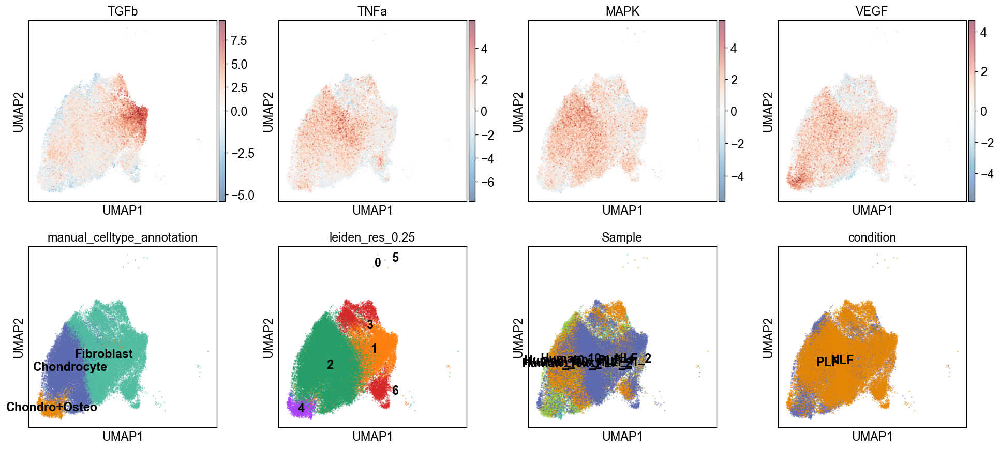

In [13]:
leiden_resolution = 0.5

#sc.pp.neighbors( obj.adata_subset,  n_neighbors = 20, n_pcs = 6 ) 
#sc.tl.umap( obj.adata_subset )
sc.tl.leiden( obj.adata_subset, key_added = "leiden_res_{}".format( leiden_resolution ), resolution = leiden_resolution, flavor = "igraph"   )    # resolution을 각각에 대해서 수행하고,  key를 붙여줌
#sc.pl.umap( obj.adata_subset, color = ['Sample', 'leiden_res_0.25' ] , wspace = 0.5 )

import decoupler as dc
import warnings
warnings.filterwarnings("ignore")

progeny = dc.get_progeny(organism = "human", top = 500)       # Progeny라는 TF database 다운받기

dc.run_mlm(  mat = obj.adata_subset,  net = progeny,  source="source",  target="target",  weight="weight", use_raw =  False, verbose = False )

obj.adata_subset.obsm["progeny_mlm_estimate"] = obj.adata_subset.obsm["mlm_estimate"].copy()
obj.adata_subset.obsm["progeny_mlm_pvals"] = obj.adata_subset.obsm["mlm_pvals"].copy()

acts = dc.get_acts(obj.adata_subset, obsm_key = "mlm_estimate")

sc.set_figure_params ( dpi = 60,  facecolor="white" )
sc.pl.umap(acts, color = ["TGFb", "TNFa","MAPK", "VEGF",  "manual_celltype_annotation", "leiden_res_0.25", "Sample", "condition"], cmap = "RdBu_r", vcenter = 0, ncols = 4,  alpha = 0.5, size = 10,  legend_loc = "on data" )

### Save 10x data for Seurat input 
-  file.path ( WORKING_PATH, "Analysis", paste0("~", DATE), "83-2.Scanpy_CellChat"  로 다운받아서 넣어두기

In [14]:
from scipy import io

# 썼다 지웠다
if os.path.exists ( "/data/project/OPLL/02.scRNA/script/scanpy/83-2.Scanpy_CellChat/{}".format (obj.Sample_ID) ):
    os.system ( "rm -rf /data/project/OPLL/02.scRNA/script/scanpy/83-2.Scanpy_CellChat/{}".format (obj.Sample_ID) )
if not os.path.exists ( "/data/project/OPLL/02.scRNA/script/scanpy/83-2.Scanpy_CellChat/{}".format (obj.Sample_ID) ):
    os.makedirs ( "/data/project/OPLL/02.scRNA/script/scanpy/83-2.Scanpy_CellChat/{}".format (obj.Sample_ID) )

print ( obj.adata.obs.shape )
obj.adata.obs.to_csv ( "/data/project/OPLL/02.scRNA/script/scanpy/83-2.Scanpy_CellChat/{}/metadata.csv".format (obj.Sample_ID) )
with open ("/data/project/OPLL/02.scRNA/script/scanpy/83-2.Scanpy_CellChat/{}/barcodes.tsv".format (obj.Sample_ID), "w") as f:
    for item in obj.adata.obs_names:
        f.write (item + "\n")
os.system ( "gzip /data/project/OPLL/02.scRNA/script/scanpy/83-2.Scanpy_CellChat/{}/barcodes.tsv".format (obj.Sample_ID) )
with open ("/data/project/OPLL/02.scRNA/script/scanpy/83-2.Scanpy_CellChat/{}/features.tsv".format (obj.Sample_ID), "w") as f:
    for item in ['\t'.join ( [x, x, 'Gene Expression']) for x in obj.adata.var_names]:
        f.write (item + "\n")
os.system ( "gzip /data/project/OPLL/02.scRNA/script/scanpy/83-2.Scanpy_CellChat/{}/features.tsv".format (obj.Sample_ID) )

# Raw data를 내보내기
io.mmwrite ( "/data/project/OPLL/02.scRNA/script/scanpy/83-2.Scanpy_CellChat/{}/matrix.mtx".format (obj.Sample_ID), obj.adata.layers["counts"].T )       # Raw data
#io.mmwrite ( "/data/project/OPLL/02.scRNA/script/scanpy/83-2.Scanpy_CellChat/{}/matrix.mtx".format (obj.Sample_ID), obj.adata.X.T )         # Normalized data
os.system ( "gzip /data/project/OPLL/02.scRNA/script/scanpy/83-2.Scanpy_CellChat/{}/matrix.mtx".format (obj.Sample_ID) )


(58780, 21)


0

### Manual annotation 이후에 다시 한번 정리 (Marker 등)

categories: Chondro+Osteo, Chondrocyte, Endothelial cells, etc.
var_group_labels: 0, 1, 2, etc.
Chondro+Osteo: 167개
Chondrocyte: 57개
Endothelial cells: 165개
Fibroblast: 63개
Lymphocyte: 93개
Macrophage: 167개
Platelets: 72개
Background = 784


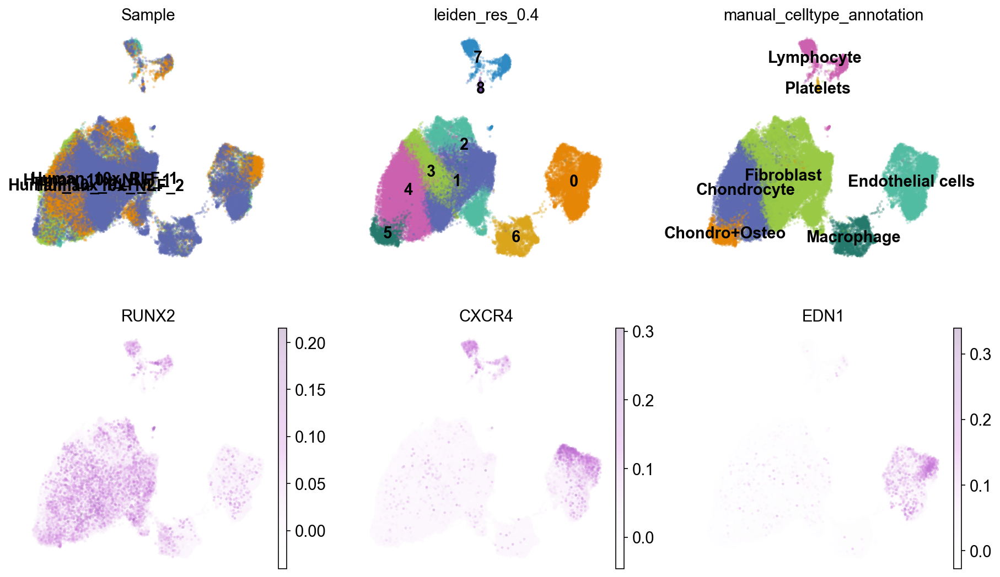

In [15]:
################################################ Marker 구하기 #1. ( rank_genes_groups_dotplot에서 제공하는 분율을 이용)  ###########################################################

dotp = sc.pl.rank_genes_groups_dotplot(  obj.adata, groupby = "manual_celltype_annotation", key = "wilcoxon", n_genes = 900, save = ":" + obj.Sample_ID + "_02-1.Marker_gene.png", return_fig = True ) #  standard_scale="var", 

def filter_columns ( df, my_proportion = 0.2, other_proportion = 0.1 ):
    result = {}  # 개별 cluster에 대해서 dictionary로 만든다
    for i in range( df.shape[0] ):
        row_i = df.iloc[ i ]
        
        condition1 = row_i > my_proportion
        condition2 = df.drop ( df.index[i] ).mean() < other_proportion
        
        selected_columns = df.columns [ condition1 & condition2 ]
    
        result [ df.index[i] ] = sorted ( list ( set( selected_columns) )  )
    
    return result

# Apply the function
selected_columns = filter_columns ( dotp.dot_size_df, my_proportion = 0.3, other_proportion = 0.2 )

li_background = []
for key, li in selected_columns.items():
    print ( "{}: {}개".format (key, len (li)))

    if not os.path.exists(  "/data/project/OPLL/02.scRNA/script/scanpy/83-3.Scanpy_NichenetR/2.markers/{}".format (obj.Sample_ID) ):
        os.makedirs(  "/data/project/OPLL/02.scRNA/script/scanpy/83-3.Scanpy_NichenetR/2.markers/{}".format (obj.Sample_ID) )
    pd.DataFrame  (  sorted( set (li) ) ).to_csv ( "/data/project/OPLL/02.scRNA/script/scanpy/83-3.Scanpy_NichenetR/2.markers/{}/{}.tsv".format( obj.Sample_ID, key) , index = False, header = False)
    li_background += li

pd.DataFrame  (  sorted( set (li_background) ) ).to_csv ( "/data/project/OPLL/02.scRNA/script/scanpy/83-3.Scanpy_NichenetR/2.markers/{}/background.tsv".format( obj.Sample_ID) , index = False, header = False)
print ( "Background = {}".format( len (li_background) ) )



# ################################################ Marker 구하기 #2. ( get.rank_genes_groups_df를 이용. 근데 잘 모르겠다)  ###########################################################

# cl_annotation_rev = {}
# for key, value in cl_annotation.items():
#     if value not in cl_annotation_rev:
#         cl_annotation_rev[value] = [key]  # Create a list if the value is not yet in the reversed dict
#     else:
#         cl_annotation_rev[value].append(key)  # Append the key to the existing list

# li_background = []
# for key, values in cl_annotation_rev.items():
#     li = []
#     for value in values:
#         print (key, value )
#         d = sc.get.rank_genes_groups_df( obj.adata, group =  value, key = "filtered" )  
#         li += sorted ( d [ ( d [ 'logfoldchanges'].isna() | ( d [ 'logfoldchanges'] >= 3 ) & ( d ['scores'] > 0 ) ) ] ["names"] )
#     li_background += li
#     print ( "\tlen = {}\t{}".format ( len ( set(li) ) , sorted( set (li) ) ) )

#     output_dir = "/data/project/OPLL/02.scRNA/script/scanpy/markers/" + obj.Sample_ID
#     if not os.path.exists( output_dir ):
#         os.makedirs( output_dir )
#     pd.DataFrame  (  sorted( set (li) ) ).to_csv ( output_dir + "/{}.tsv".format(key) , index = False, header = False)

# pd.DataFrame  (  sorted( set (li_background) ) ).to_csv ( output_dir + "/background.tsv" , index = False, header = False)
# print ( "Background = {}".format( len (li_background) ) )


# 
sc.settings.set_figure_params(dpi = 75, facecolor="white")
sc.pl.umap ( obj.adata, color = [ "Sample", obj.cluster_name, "manual_celltype_annotation", "RUNX2", "CXCR4", "EDN1" ], s = 20, alpha = 0.3, frameon=False, ncols = 3, cmap = my_cmap, legend_loc = "on data", save = ":" + obj.Sample_ID + "_01-2.Clustering.png"  ) # legend_loc = "on data"

---

### Stacked bar plot

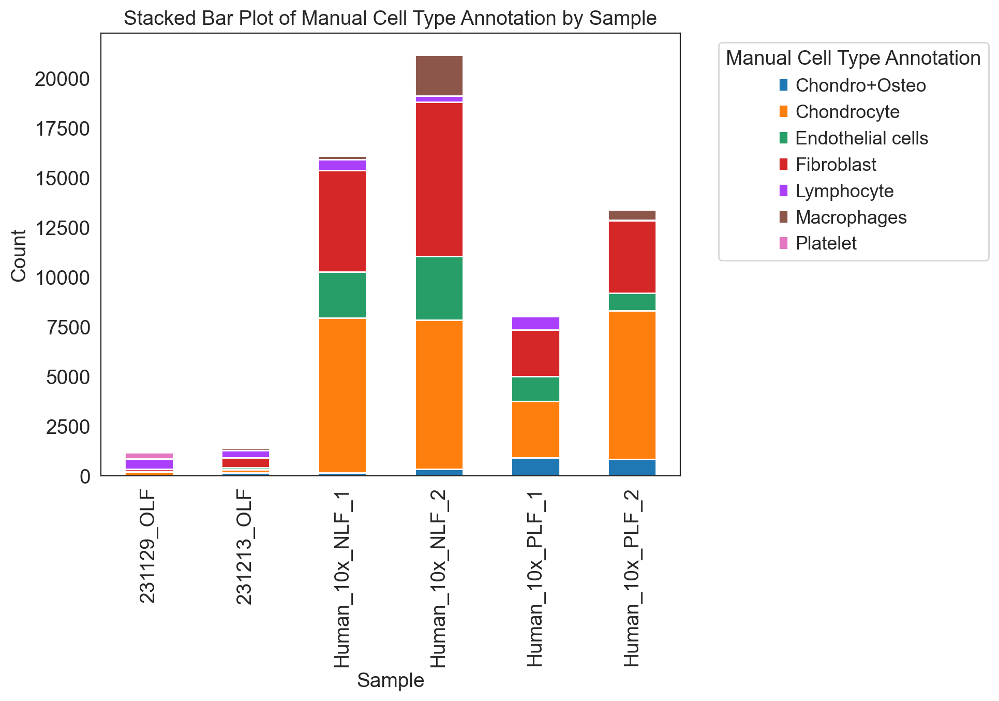

In [51]:
obj.cellcount_df = obj.adata.obs.groupby ( ["Sample", "manual_celltype_annotation"]).count().iloc [:, 0].reset_index ( name = 'count')
obj.cellcount_df_by_condition = obj.adata.obs.groupby ( ["condition", "manual_celltype_annotation"]).count().iloc [:, 0].reset_index ( name = 'count')


obj.cellcount_df_pivot = obj.cellcount_df.pivot(index = 'Sample', columns = 'manual_celltype_annotation', values = 'count')
obj.cellcount_df_pivot = obj.cellcount_df_pivot.fillna(0)   # Fill NaN values with 0 if necessary

# Plot stacked bar plot
import seaborn as sns
sns.set_style ("white")
ax = obj.cellcount_df_pivot.plot( kind = 'bar', stacked = True, figsize = (10, 7))

# Set plot labels and title
ax.set_xlabel( 'Sample' )
ax.set_ylabel ( 'Count' )
ax.set_title ( 'Stacked Bar Plot of Manual Cell Type Annotation by Sample' )

# Show the legend
plt.legend(title='Manual Cell Type Annotation', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show plot
plt.tight_layout()
plt.show()

obj.cellcount_df.to_csv ( "/data/project/OPLL/02.scRNA/script/scanpy/cellcount_df/{}.tsv".format ( obj.Sample_ID ), sep = "\t", index = False)

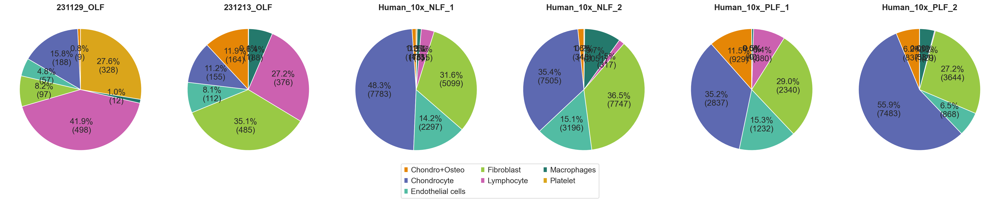

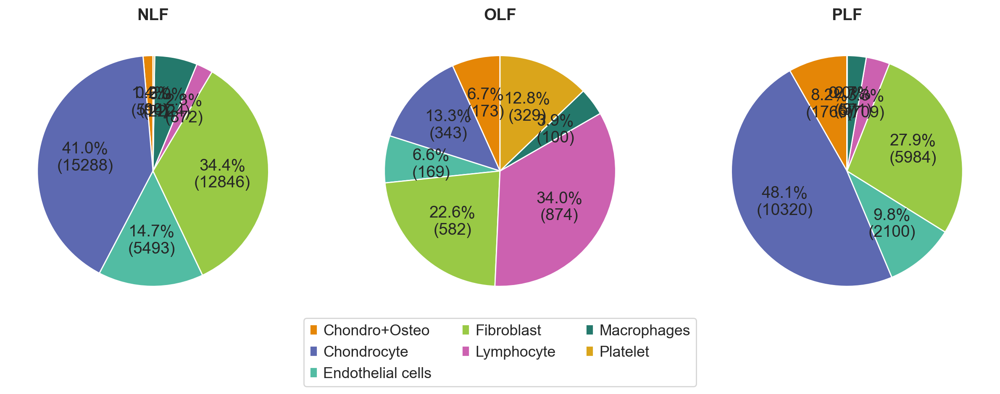

In [54]:
# Create subplots
labels = obj.cellcount_df ['manual_celltype_annotation'].unique()
colors = plt.cm.tab20(np.linspace(0, 1, len(labels)))
colors = vivid_10


def func(pct, allvals):
    absolute = int(np.round(pct/100.*np.sum(allvals)))
    return f"{pct:.1f}%\n({absolute:d})"


################### Sample에 따서 그리기 ###################
num_samples = len( obj.cellcount_df  ['Sample'].unique() )
fig, axs = plt.subplots(1, num_samples, figsize=(5 * num_samples, 5))
if num_samples == 1:
    axs = [axs]
fig.subplots_adjust (wspace = 0.1 )
    
for ax, sample in zip(axs, obj.cellcount_df["Sample"].unique() ):
    sample_data = obj.cellcount_df  [ obj.cellcount_df  ['Sample'] == sample]
    #ax.pie(sample_data['count'], labels = sample_data['manual_celltype_annotation'], autopct = '%1.1f%%', labeldistance = 1)     # labeldistance 0 이면 중심에 모여잇고, 1이면 호에 딱 붙어있음
    wedges, texts, autotexts = ax.pie ( sample_data['count'], labels = None, autopct  = lambda pct: func(pct, sample_data['count']), labeldistance = 1, startangle = 90,
                                                            colors=[colors[list(labels).index(label)] for label in sample_data['manual_celltype_annotation']]   )     # labeldistance 0 이면 중심에 모여잇고, 1이면 호에 딱 붙어있음
    ax.set_title( sample, fontdict = {"fontweight" : "bold"} )

fig.legend( wedges, labels, loc = 'lower center', ncol = len(labels)//2)
fig.savefig (  "/data/project/OPLL/02.scRNA/script/scanpy/figures/{}/pieplot_01.pie_by_sample.png".format (obj.Sample_ID), dpi = 300 )


################### Sample에 따서 그리기 ###################
num_condition = len( obj.cellcount_df_by_condition  ['condition'].unique() )
fig_2, axs_2 = plt.subplots(1, num_condition, figsize=(5 * num_condition, 5))
if num_condition == 1:
    axs_2 = [axs_2]
fig.subplots_adjust (hspace = 0.1 )

for ax, condition in zip(axs_2, obj.cellcount_df_by_condition [ "condition" ].unique() ):
    sample_data = obj.cellcount_df_by_condition  [ obj.cellcount_df_by_condition  [ "condition" ] == condition ]
    #ax.pie(sample_data['count'], labels = sample_data['manual_celltype_annotation'], autopct = '%1.1f%%', labeldistance = 1)     # labeldistance 0 이면 중심에 모여잇고, 1이면 호에 딱 붙어있음
    wedges, texts, autotexts = ax.pie ( sample_data['count'], labels = None, autopct  = lambda pct: func(pct, sample_data['count']), labeldistance = 1, startangle = 90,
                                                            colors=[colors[list(labels).index(label)] for label in sample_data[ 'manual_celltype_annotation' ]]   )     # labeldistance 0 이면 중심에 모여잇고, 1이면 호에 딱 붙어있음
    ax.set_title( condition, fontdict = {"fontweight" : "bold"} )

fig_2.legend( wedges, labels, loc = 'lower center', ncol = len(labels) // 2)
fig_2.savefig (  "/data/project/OPLL/02.scRNA/script/scanpy/figures/{}/pieplot_01.pie_by_condition.png".format (obj.Sample_ID), dpi = 300 )

### Pathway activity inference (Progeny)

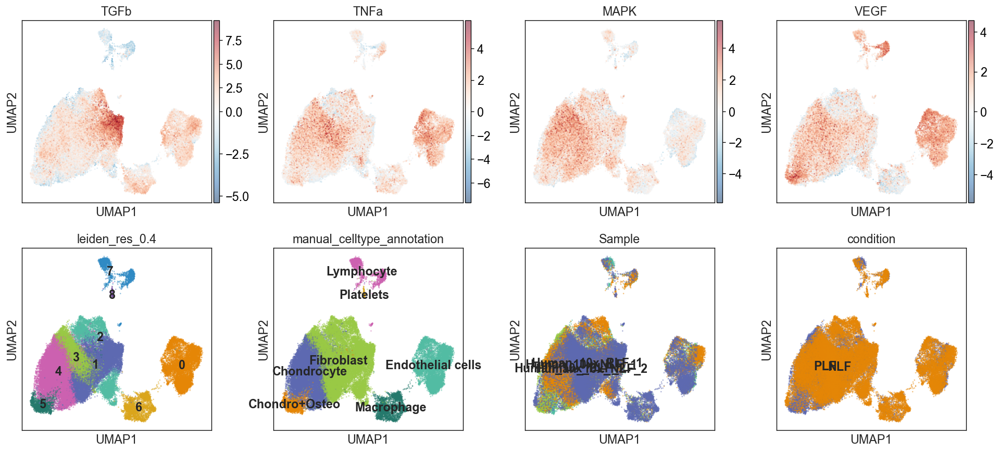

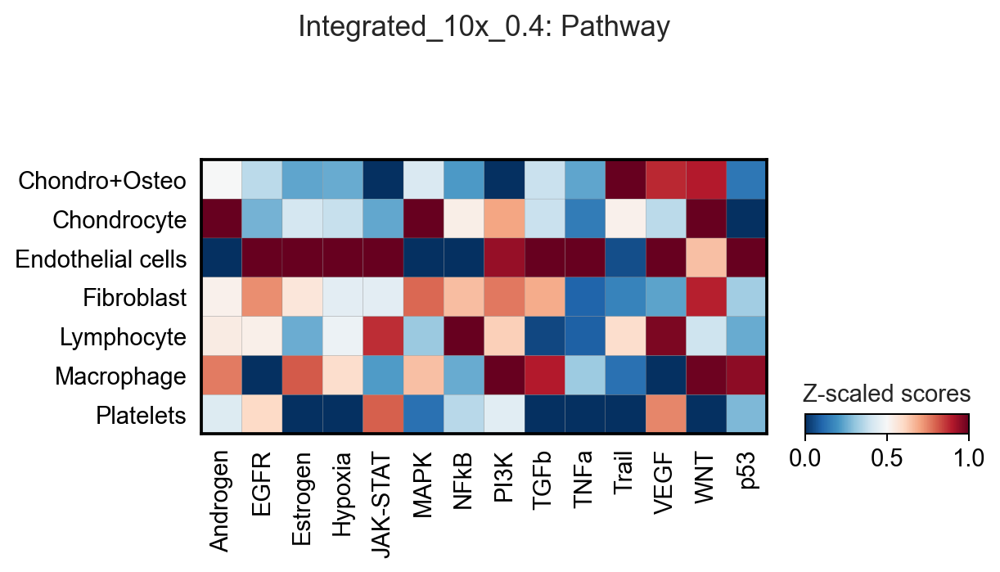

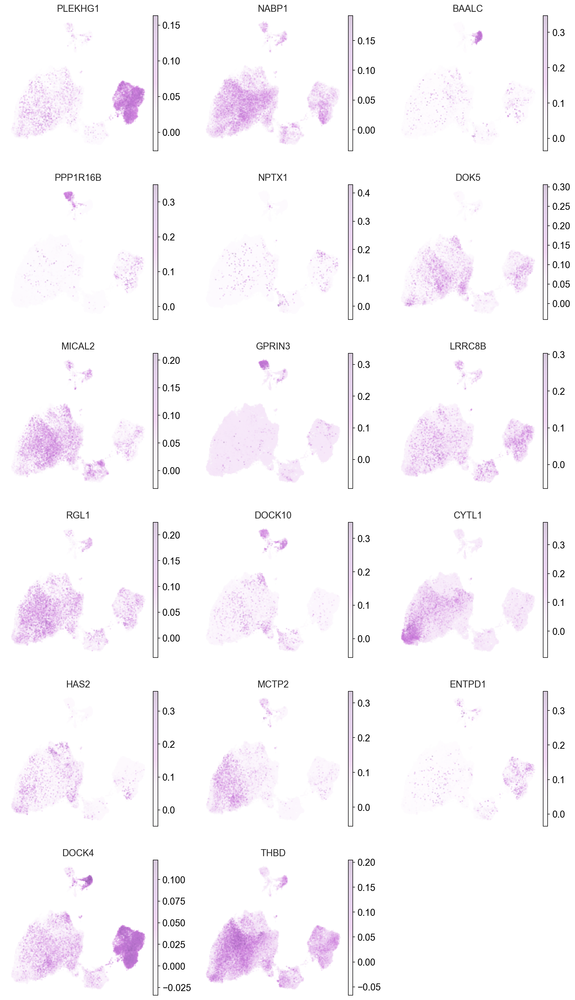

In [18]:
import warnings
warnings.filterwarnings("ignore")

progeny = dc.get_progeny(organism = "human", top = 500)       # Progeny라는 TF database 다운받기

dc.run_mlm(  mat = obj.adata,  net = progeny,  source="source",  target="target",  weight="weight", use_raw =  False, verbose = False )

obj.adata.obsm["progeny_mlm_estimate"] = obj.adata.obsm["mlm_estimate"].copy()
obj.adata.obsm["progeny_mlm_pvals"] = obj.adata.obsm["mlm_pvals"].copy()

acts = dc.get_acts(obj.adata, obsm_key = "mlm_estimate")

sc.set_figure_params ( dpi = 60,  facecolor="white" )
sc.pl.umap(acts, color = ["TGFb", "TNFa","MAPK", "VEGF",  obj.cluster_name, "manual_celltype_annotation", "Sample", "condition"], cmap = "RdBu_r", vcenter = 0, ncols = 4,  alpha = 0.5, size = 10,  legend_loc = "on data", save = ":" + obj.Sample_ID + "_02-2.PathwayInference.png" )
sc.set_figure_params ( dpi = 90,  facecolor="white" )
sc.pl.matrixplot(acts, var_names = acts.var_names, groupby = 'manual_celltype_annotation', dendrogram = False, standard_scale = 'var',  colorbar_title = 'Z-scaled scores', cmap = 'RdBu_r', title = obj.Sample_ID + ": Pathway" , save = ":" + obj.Sample_ID + "_02-2.PathwayInference.png" )


d = progeny [ (progeny["source"] == "VEGF") & (progeny ["weight"] > 1)].sort_values ( by = "weight", ascending = False)
set( d["target"] ) & set(obj.adata.var.index.tolist())

sc.settings.set_figure_params(dpi = 75, facecolor="white")
sc.pl.umap ( obj.adata, color = list( set( d["target"] ) & set(obj.adata.var.index.tolist()) ), s = 20, alpha = 0.3, frameon=False, ncols = 3, cmap = my_cmap, legend_loc = "on data" ) # legend_loc = "on data"

### TF 

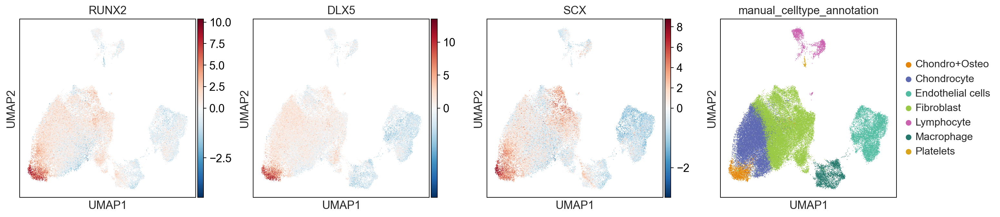

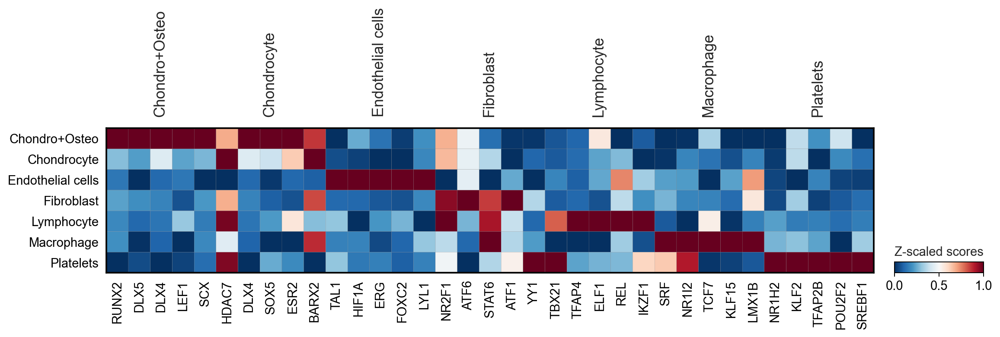

In [19]:
net = dc.get_collectri ( organism = "human", split_complexes = False)
dc.run_ulm( mat = obj.adata, net = net, source="source",  target = "target", weight = "weight", use_raw =  False,  verbose=False)  
obj.adata.obsm [ "collectri_ulm_estimate" ] = obj.adata.obsm [ "ulm_estimate" ].copy()
obj.adata.obsm [ "collectri_ulm_pvals" ] = obj.adata.obsm [ "ulm_pvals" ].copy()
acts = dc.get_acts( obj.adata, obsm_key = "ulm_estimate" )
df = dc.rank_sources_groups(acts, groupby = 'manual_celltype_annotation', reference='rest', method='t-test_overestim_var')

sc.set_figure_params ( dpi = 90,  facecolor="white" )
sc.pl.umap(acts, color = [ "RUNX2", "DLX5", "SCX", "manual_celltype_annotation" ], cmap = "RdBu_r", vcenter = 0, save = ":" + obj.Sample_ID + "_02-3.TFactivity.png")

n_markers = 5
source_markers = df.groupby("group").head(n_markers).groupby( "group" )["names"].apply( lambda x: list(x) ).to_dict()
sc.pl.matrixplot(acts, source_markers, "manual_celltype_annotation", dendrogram = False, standard_scale = "var",
                 colorbar_title="Z-scaled scores", cmap="RdBu_r",  save = ":" + obj.Sample_ID + "_02-3.TFactivity.png" )

### GSEA (decoupler.run_gsea) : cluster specific

In [20]:
p_threshold = 0.1

df_gmt, source = gmt_to_decoupler( "/data/project/OPLL/c5.go.bp.v2023.2.Hs.symbols.gmt" )      # c5bp
# df_gmt, source = gmt_to_decoupler( "/data/project/OPLL/02.scRNA/script/scanpy/c2.cp.reactome.v7.5.1.symbols.gmt" )      # Reactome
# df_gmt, source = gmt_to_decoupler( "/home/goldpm1/resources/goatools/c2.cp.v2023.2.Hs.symbols.gmt" )      # Reactome-Wiki - Kegg
# df_gmt, source = gmt_to_decoupler( "/data/project/OPLL/02.scRNA/script/scanpy/c8.all.v2023.2.Hs.symbols.gmt" )      # C8: cell type
# df_gmt, source = gmt_to_decoupler( "/data/project/OPLL/02.scRNA/script/scanpy/h.all.v2023.2.Hs.symbols.gmt" )      # hallmark

df_gmt = df_gmt.drop_duplicates( [source, 'genesymbol'], keep = 'first' )

geneset_size = df_gmt.groupby( source ).size()
gsea_genesets = geneset_size.index[(geneset_size > 1) & (geneset_size < 500)]

sc.tl.rank_genes_groups( obj.adata, "manual_celltype_annotation", method="t-test", key_added="t-test")

gsea_results_acc = pd.DataFrame ( columns = ["score", "norm", "pval", "manual_celltype_annotation"])
for cluster in  set ( obj.adata.obs["manual_celltype_annotation"] ) :         # 각 cluster마다 돌면서 GSEA를 구하고 acc에 더함
    t_stats = ( sc.get.rank_genes_groups_df( obj.adata, [ cluster ], key="t-test")
                    .set_index("names")
                    .sort_values("scores", key=np.abs, ascending=False)
                    [["scores"]].rename_axis( cluster , axis=1)
                    )

    # Run_gsea
    scores, norm, pvals = decoupler.run_gsea(  t_stats.T,   df_gmt [ df_gmt[ source ].isin( gsea_genesets ) ],  source = source,  target = "genesymbol"   )

    gsea_results =  pd.concat({"score": scores.T, "norm": norm.T, "pval": pvals.T}, axis = 1) .droplevel(level = 1, axis = 1)  .sort_values("pval")
    gsea_results  = gsea_results [ gsea_results["pval"] < p_threshold ]
    gsea_results [  "manual_celltype_annotation" ] = cluster
    gsea_results_acc =  pd.concat ( [gsea_results_acc, gsea_results ] )


if not os.path.exists(  obj.SavePATH.replace("AnnData", "gsea_df") + "/{}".format (obj.Sample_ID) ):
    os.makedirs(  obj.SavePATH.replace("AnnData", "gsea_df") + "/{}".format (obj.Sample_ID) )

gsea_results_acc [ gsea_results_acc["score"] > 0 ].loc [ :, ["manual_celltype_annotation", "score", "pval"] ].to_csv (  obj.SavePATH.replace("AnnData", "gsea_df") + "/{}/df:gsea_by_cluster.tsv".format (obj.Sample_ID), sep = "\t", index = True )
gsea_results_acc

,score,norm,pval,manual_celltype_annotation
GOBP_ALPHA_BETA_T_CELL_ACTIVATION,0.613799,1.943234,0.000000,Lymphocyte
GOBP_ALCOHOL_METABOLIC_PROCESS,-0.633850,-1.791103,0.000000,Lymphocyte
GOBP_FC_GAMMA_RECEPTOR_SIGNALING_PATHWAY,0.840557,2.082721,0.000000,Lymphocyte
GOBP_LYMPHOCYTE_ACTIVATION_INVOLVED_IN_IMMUNE_RESPONSE,0.701882,2.229719,0.000000,Lymphocyte
GOBP_LYMPHOCYTE_MEDIATED_IMMUNITY,0.608766,1.918190,0.000000,Lymphocyte
...,...,...,...,...
GOBP_POSITIVE_REGULATION_OF_POTASSIUM_ION_TRANSPORT,-0.669073,-1.376702,0.097506,Endothelial cells
GOBP_POSITIVE_REGULATION_OF_RESPONSE_TO_WOUNDING,0.571548,1.407090,0.098706,Endothelial cells
GOBP_RESPONSE_TO_XENOBIOTIC_STIMULUS,0.427508,1.322370,0.098802,Endothelial cells
GOBP_NEGATIVE_REGULATION_OF_STEM_CELL_DIFFERENTIATION,0.737166,1.393306,0.098921,Endothelial cells


---

## Cell to Cell Communication (CCC)

## 1. LIANA (Ligand - Receptor)

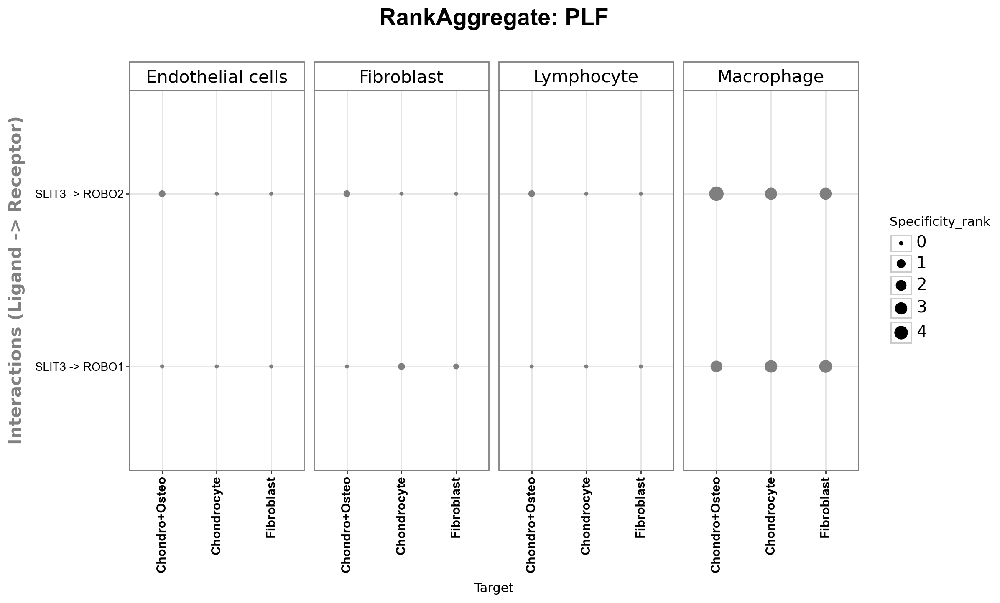

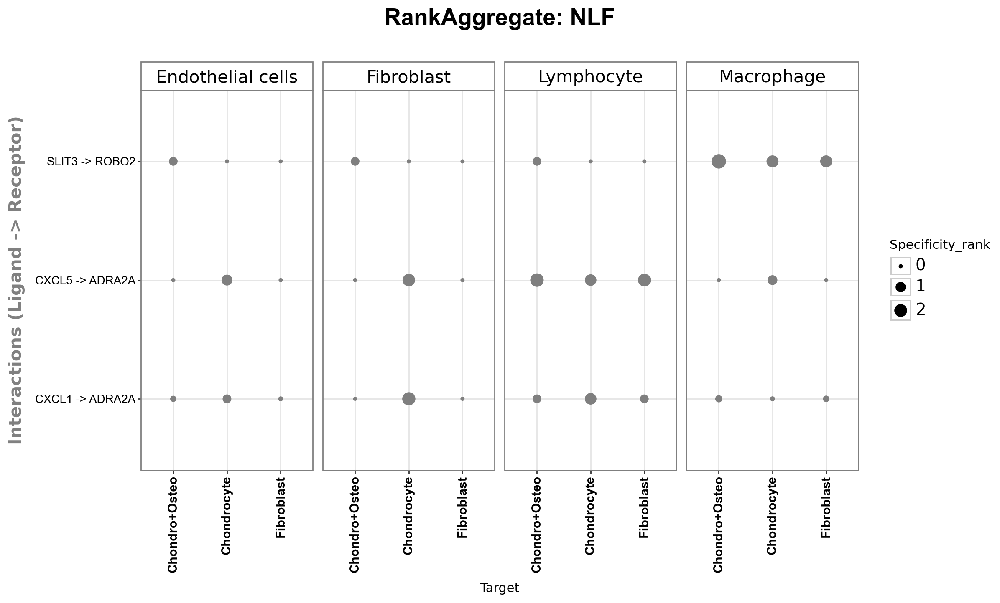

Using `.X`!
The following cell identities were excluded: Platelets
0.86 of entities in the resource are missing from the data.
Generating ligand-receptor stats for 21452 samples and 1239 features


100%|██████████| 1000/1000 [00:26<00:00, 38.23it/s]


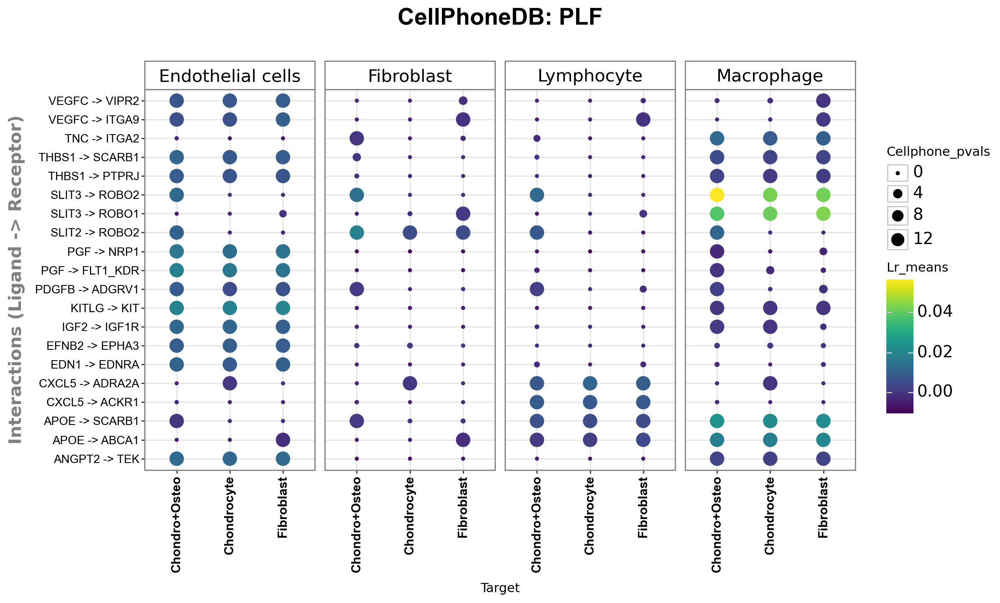

Using `.X`!
0.86 of entities in the resource are missing from the data.
Generating ligand-receptor stats for 37327 samples and 1239 features


100%|██████████| 1000/1000 [00:43<00:00, 23.19it/s]


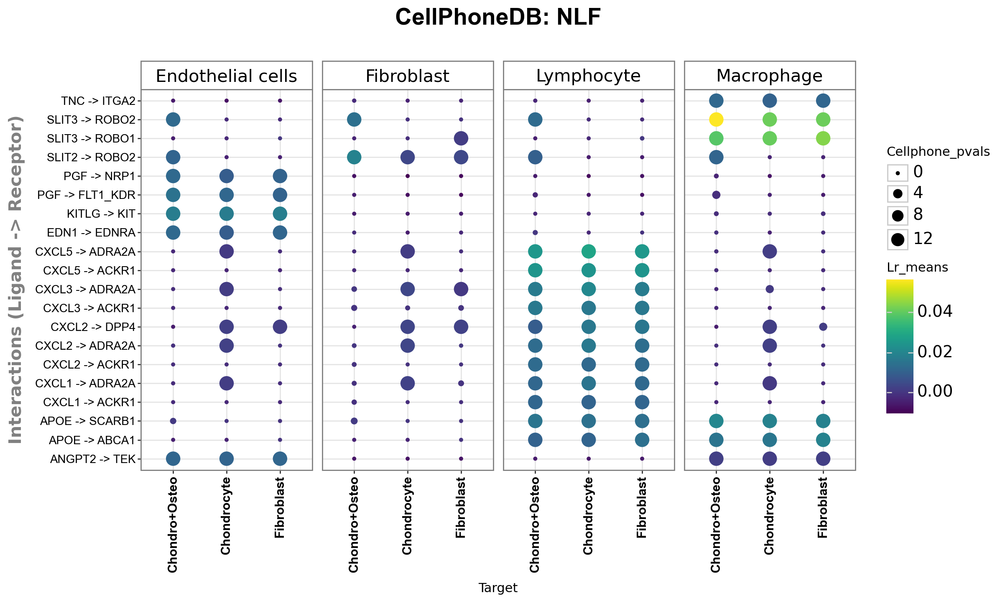

Using `.X`!
The following cell identities were excluded: Platelets
0.86 of entities in the resource are missing from the data.
Generating ligand-receptor stats for 21452 samples and 1239 features


100%|██████████| 1000/1000 [01:31<00:00, 10.91it/s]


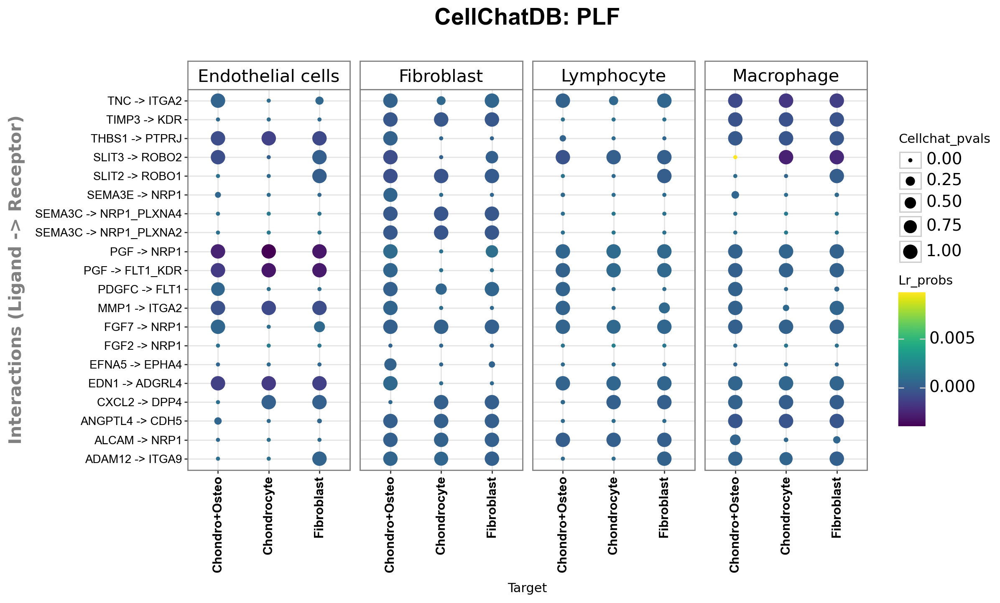

Using `.X`!
0.86 of entities in the resource are missing from the data.
Generating ligand-receptor stats for 37327 samples and 1239 features


100%|██████████| 1000/1000 [02:42<00:00,  6.15it/s]


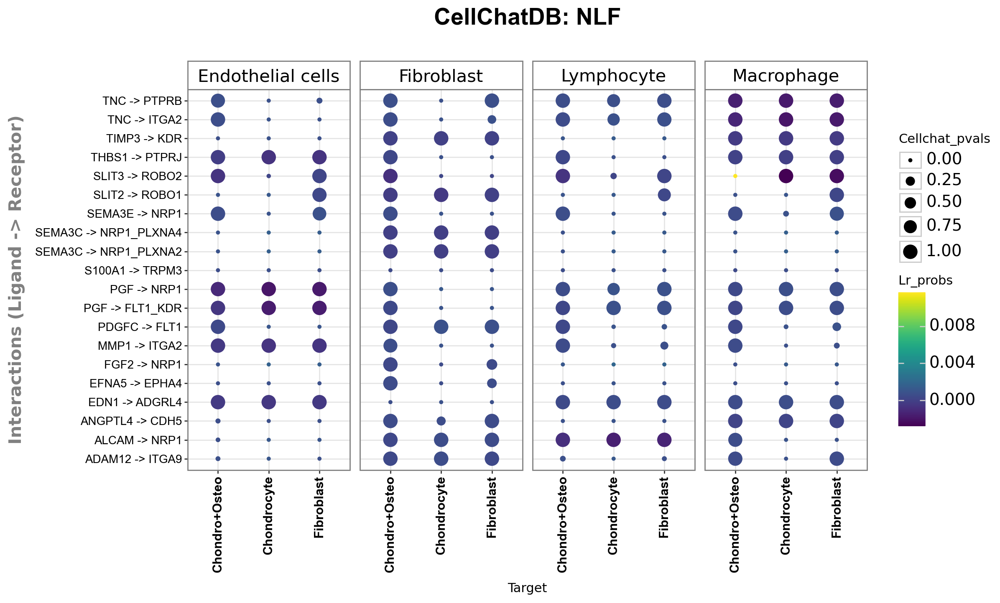

In [33]:
import plotnine as p9
import liana as li
from liana.method import singlecellsignalr, connectome, cellphonedb, natmi, logfc, cellchat, geometric_mean, rank_aggregate
%matplotlib inline

#1. 다 합친 것
def LIANA_RANK_AGGREGATE ( adata, source_labels, target_labels, Sample_ID, Group_ID ):
    rank_aggregate(  adata, groupby = "manual_celltype_annotation", use_raw = False,  return_all_lrs = True, verbose = False )   # CellPhone DB, CellChat 등 모든 db를 다 써서 consensus를 구함  약 3분 걸림
    adata.uns["liana_res"].drop_duplicates(   ["ligand_complex", "receptor_complex"] )

    ax = li.pl.dotplot( adata = adata,   colour = "magnitude_rank",   size = "specificity_rank",
        inverse_size = True,  # we inverse sign since we want small p-values to have large sizes
        source_labels = source_labels,    target_labels = target_labels,
        filterby = "specificity_rank",    filter_lambda = lambda x: x <= 0.01,
        orderby = "lr_means",    orderby_ascending = False,  # we want to prioritize those with highest expression
        top_n = 20,     figure_size=(12, 7),     size_range=(1, 6) ) +  p9.ggtitle ( "RankAggregate: {}".format (Group_ID) )  + p9.theme ( plot_title = p9.element_text( size = 20, family = "arial",  face = "bold", color = "black") , axis_text = p9.element_text ( colour ="black", family = "arial")   ) 
    p9.ggsave (  ax,  "/data/project/OPLL/02.scRNA/script/scanpy/figures/{}/liana_{}:01.rank_aggregate.png".format ( Sample_ID, Group_ID ) )
    ax.show()

#2. Cellphone DB
def LIANA_CELLPHONEDB ( adata, source_labels, target_labels, Sample_ID, Group_ID ):
    cellphonedb(  adata, groupby = "manual_celltype_annotation", use_raw = False, return_all_lrs = True, verbose = True )   #"leiden_res_0."
    adata.uns["liana_res"].drop_duplicates(   ["ligand_complex", "receptor_complex"] )

    ax = li.pl.dotplot( adata = adata,   colour = "lr_means",   size = "cellphone_pvals",
        inverse_size = True,  # we inverse sign since we want small p-values to have large sizes
        source_labels = source_labels,    target_labels = target_labels,
        filterby = "cellphone_pvals",    filter_lambda = lambda x: x <= 0.01,
        orderby = "lr_means",    orderby_ascending = False,  # we want to prioritize those with highest expression
        top_n = 20,     figure_size = (12, 7),     size_range = (1, 6) ) +  p9.ggtitle ( "CellPhoneDB: {}".format (Group_ID) ) + p9.theme ( plot_title = p9.element_text( size = 20, family = "arial",  face = "bold", color = "black") , axis_text = p9.element_text ( colour="black", family = "arial")   ) 
    p9.ggsave ( ax, "/data/project/OPLL/02.scRNA/script/scanpy/figures/{}/liana_{}:02.CellphoneDB.png".format ( Sample_ID, Group_ID), dpi = 300)
    ax.show() 

#3. CellChat
def LIANA_CELLCHAT ( adata, source_labels, target_labels, Sample_ID, Group_ID  ):
    cellchat(  adata, groupby = "manual_celltype_annotation", use_raw=False, return_all_lrs=True, verbose=True ) 
    adata.uns["liana_res"].drop_duplicates(   ["ligand_complex", "receptor_complex"] )

    ax = li.pl.dotplot( adata = adata,   colour = "lr_probs",   size = "cellchat_pvals",
        inverse_size = False,  # we inverse sign since we want small p-values to have large sizes
        source_labels = source_labels,    target_labels = target_labels,
        filterby = "cellchat_pvals",    filter_lambda = lambda x: x <= 0.01,
        orderby = "lr_probs",    orderby_ascending = False,  # we want to prioritize those with highest expression
        top_n = 20,     figure_size=(12, 7),     size_range=(1, 6)  )  +  p9.ggtitle ( "CellChatDB: {}".format (Group_ID) ) + p9.theme ( plot_title = p9.element_text( size = 20, family = "arial",  face = "bold", color = "black") , axis_text = p9.element_text ( colour="black", family = "arial")  ) 
    p9.ggsave ( ax, "/data/project/OPLL/02.scRNA/script/scanpy/figures/{}/liana_{}:03.CellChat.png".format ( Sample_ID, Group_ID ), dpi = 300)
    ax.show()
    

source_labels = list ( set ( [ "Fibroblast", "Lymphocyte", "Macrophage", "Endothelial cells" ] ) & set ( obj.adata.obs["manual_celltype_annotation"] ) )
target_labels = list ( set ( [ "Osteoblast", "Chondrocyte", "Chondro+Osteo", "Fibroblast"] ) &  set ( obj.adata.obs["manual_celltype_annotation"] )  )

LIANA_RANK_AGGREGATE ( obj.adata [ obj.adata.obs["condition"] == "PLF" ], source_labels, target_labels, obj.Sample_ID, "PLF" )
LIANA_RANK_AGGREGATE ( obj.adata [ obj.adata.obs["condition"] == "NLF" ], source_labels, target_labels, obj.Sample_ID, "NLF" )
LIANA_CELLPHONEDB ( obj.adata [ obj.adata.obs["condition"] == "PLF" ], source_labels, target_labels, obj.Sample_ID, "PLF" )
LIANA_CELLPHONEDB ( obj.adata [ obj.adata.obs["condition"] == "NLF" ], source_labels, target_labels, obj.Sample_ID, "NLF" )
LIANA_CELLCHAT ( obj.adata [ obj.adata.obs["condition"] == "PLF" ], source_labels, target_labels, obj.Sample_ID, "PLF"  )
LIANA_CELLCHAT ( obj.adata [ obj.adata.obs["condition"] == "NLF" ], source_labels, target_labels, obj.Sample_ID, "NLF"  )

---

## 2. NicheNetR

### NichenetR의 후보 ligand, receptor 준비 (10% 이상 발현된 gene만 뽑기)
- (Local) Analysis/~DATE/83-3.Scany_NichenetR/3.receiver_sender에 넣어준다

In [21]:
##  Sender / Target을 정해줘야 함
# labels = list ( set ( [ "Chondro+Osteo", "Fibroblast", "Chondrocyte", "Lymphocyte", "Macrophage", "Endothelial cells" ] ) & set ( obj.adata.obs["manual_celltype_annotation"] ) )
# target_labels = list ( set ( [  "Chondro+Osteo", "Fibroblast", "Chondrocyte"] ) &  set ( obj.adata.obs["manual_celltype_annotation"] )  )

from functools import reduce

def get_expressed_genes(adata, cell_type, expr_prop):
    # calculate proportions
    temp = adata[ adata.obs["manual_celltype_annotation"] == cell_type, :]
    a = temp.layers["counts"].getnnz (axis = 0) / temp.X.shape[0]
    stats =  pd.DataFrame({"genes": temp.var_names, "props": a}).assign(cell_type = cell_type).sort_values("genes") 
    # obtain expressed genes
    stats = stats[stats["props"] >= expr_prop]
    expressed_genes = stats["genes"].values
    return expressed_genes

if not os.path.exists(  "/data/project/OPLL/02.scRNA/script/scanpy/83-3.Scanpy_NichenetR/3.receiver_sender/{}".format (obj.Sample_ID) ):
    os.makedirs(  "/data/project/OPLL/02.scRNA/script/scanpy/83-3.Scanpy_NichenetR/3.receiver_sender/{}".format (obj.Sample_ID) )

# 10% 이상 발현되는 cell들만 고르기 (sender, receiver에서 각각)
for labels in  [ [ "Fibroblast", "Chondrocyte" ], [ "Chondro+Osteo", "Fibroblast", "Chondrocyte" ], [ "Chondro+Osteo", "Fibroblast", "Chondrocyte", "Macrophage" ], [ "Chondro+Osteo", "Fibroblast", "Chondrocyte", "Macrophage", "Endothelial cells" ], ["Chondro+Osteo"], ["Fibroblast"], ["Chondrocyte"], ["Lymphocyte"], ["Macrophage"], ["Endothelial cells"] ]:
    expressed = reduce(  np.union1d,    [  get_expressed_genes( obj.adata, cell_type, 0.1) for cell_type in labels ] )
    print ("labels : {}\tlen( expressed ) : {}".format (labels, len ( expressed ) ))
    pd.DataFrame ( list( expressed )) .to_csv ("/data/project/OPLL/02.scRNA/script/scanpy/83-3.Scanpy_NichenetR/3.receiver_sender/{}/expressed_{}.txt".format ( obj.Sample_ID, "_".join (labels) ), sep = "\n", header = False, index = False )

labels : ['Fibroblast', 'Chondrocyte']	len( expressed ) : 730
labels : ['Chondro+Osteo', 'Fibroblast', 'Chondrocyte']	len( expressed ) : 804


labels : ['Chondro+Osteo', 'Fibroblast', 'Chondrocyte', 'Macrophage']	len( expressed ) : 886
labels : ['Chondro+Osteo', 'Fibroblast', 'Chondrocyte', 'Macrophage', 'Endothelial cells']	len( expressed ) : 980
labels : ['Chondro+Osteo']	len( expressed ) : 731
labels : ['Fibroblast']	len( expressed ) : 683
labels : ['Chondrocyte']	len( expressed ) : 633
labels : ['Lymphocyte']	len( expressed ) : 554
labels : ['Macrophage']	len( expressed ) : 633
labels : ['Endothelial cells']	len( expressed ) : 668


### Pseudobulk + DEG & NicheNet에 사용할 geneset_oi 뽑기 
- background genes: receiver가 표현하는 모든 gene들
- genelist_oi: receiver가 A condtion vs B condition에서 표현하는 DEG

In [22]:
# Load pickle
with open( file = "/data/project/OPLL/02.scRNA/script/scanpy/pickle/Fibroblast.pickle", mode = 'rb') as f:
    Fib = pickle.load(f)
with open( file = "/data/project/OPLL/02.scRNA/script/scanpy/pickle/Chondrocyte.pickle", mode = 'rb') as f:
    Ch = pickle.load(f)
with open( file = "/data/project/OPLL/02.scRNA/script/scanpy/pickle/Lymphocyte.pickle", mode = 'rb') as f:
    Lym = pickle.load(f)
with open( file = "/data/project/OPLL/02.scRNA/script/scanpy/pickle/Macrophage.pickle", mode = 'rb') as f:
    Mac = pickle.load(f)
with open( file = "/data/project/OPLL/02.scRNA/script/scanpy/pickle/Endothelial cells.pickle", mode = 'rb') as f:
    End = pickle.load(f)
with open( file = "/data/project/OPLL/02.scRNA/script/scanpy/pickle/Chondro+Osteo.pickle", mode = 'rb') as f:
    Ch_Ost = pickle.load(f)
with open( file = "/data/project/OPLL/02.scRNA/script/scanpy/pickle/Ch_Fib.pickle", mode = 'rb') as f:
    Ch_Fib = pickle.load(f)
with open( file = "/data/project/OPLL/02.scRNA/script/scanpy/pickle/subset.pickle", mode = 'rb') as f:
    subset = pickle.load(f)


In [27]:
pd.DataFrame ( Fib.pdata_i.X, index = Fib.pdata_i.obs.index, columns = Fib.pdata_i.var.index ) .loc [: , ["ENDRB"] ]
pd.DataFrame ( Fib.pdata_i.layers["normed_counts"], index = Fib.pdata_i.obs.index, columns = Fib.pdata_i.var.index ) .loc [: , ["ENDRB"] ]

KeyError: "None of [Index(['ENDRB'], dtype='object')] are in the [columns]"

### GSEA_function

In [24]:
import decoupler as dc
from gseapy.plot import gseaplot
import gseapy as gp

global msig, gmt
#gp.Msigdb().list_category(dbver="2023.1.Hs")          #   'c5.all',  'c5.go.bp',  'c5.go.cc',  'c5.go.mf',  'c5.go',  'c5.hpo',   msig.list_dbver()
gmt = gp.Msigdb().get_gmt ( category = "c5.go",  dbver="2023.1.Hs" )   #gmt = msig.get_gmt ( category = "c5.bp",  dbver="2023.1.Hs" )
# gp.get_library_name()   #  'GO_Molecular_Function_2023' 'GO_Biological_Process_2023'    'Reactome_2022'   'WikiPathways_2019_Human'   'GWAS_Catalog_2023' 등 엄청나게 많다



def SELECT_PRNIT ( res, fdr_threshold, target_labels, OUTPUT_PATH):
    out = []
    for term in list(res.results):
        if res.results[term]['fdr'] < fdr_threshold:
            out.append( [ term, res.results[term]['fdr'], res.results[term]['es'], res.results[term]['nes'], res.results[term]['lead_genes'], res.results[term]['matched_genes'], len (res.results[term]['matched_genes'] ) ] )
    out_df = pd.DataFrame ( out, columns = ['Term','fdr', 'es', 'nes', 'lead_genes', 'matched_genes', 'num_matched_genes'] ).sort_values( 'fdr' ).reset_index ( drop = True )

    if not os.path.exists( "/".join ( OUTPUT_PATH.split("/")[:-1] ) ):
        os.makedirs( "/".join ( OUTPUT_PATH.split("/")[:-1] ) )
    out_df.to_csv ( OUTPUT_PATH, sep = "\t", index = False)

    # Visualize
    df_sorted = out_df [ out_df["fdr"] < 0.4 ]
    if df_sorted.shape[0] != 0:
        plt.rcParams["font.family"] = 'arial'
        fig, ax = plt.subplots ( figsize = (12, 4), ncols = 1, nrows = 1)
        fig.subplots_adjust ( left = 0.50, right = 0.95 )

        # Separate positive and negative NES values for bidirectional effect
        df_positive = df_sorted[df_sorted['nes'] >= 0].iloc [ 0 : 10]
        df_negative = df_sorted[df_sorted['nes'] < 0].iloc [0 : 10]
        df_negative ["fdr"] = df_negative ["fdr"] * -1

        # Normalize the 'nes' column for the color bar
        sm_up = plt.cm.ScalarMappable( cmap = "Reds", norm = plt.Normalize( 0, df_positive['nes'].max() ) )
        sm_up.set_array([]) 
        sm_down = plt.cm.ScalarMappable( cmap = "Blues_r", norm = plt.Normalize( df_negative['nes'].min(), 0 ) )
        sm_down.set_array([]) 

        sns.barplot( df_positive, y = 'Term', x = 'fdr', hue = "nes", palette = "Reds", ax = ax )  #  color='steelblue',  my_cmap
        sns.barplot( df_negative, y = 'Term', x = 'fdr', hue = "nes", palette = 'Blues_r', ax = ax )
        fig.suptitle ( "NLF vs PLF : {}".format ( target_labels) , fontsize =  16, fontweight =  "bold")
        ax.set_ylabel ( "")
        ax.tick_params ( axis = 'both', labelsize = 8, pad = 2 )


        if ax.get_legend() is not None:
            ax.get_legend().remove() # Remove the default legend
        
        # Add the color bar
        fig.colorbar ( sm_up, ax = ax).set_label( 'NES (PLF)')  # Label for the color bar
        fig.colorbar ( sm_down, ax = ax).set_label('NES (NLF)')  # Label for the color bar
        


        fig.savefig ( OUTPUT_PATH.replace ("tsv", "jpg"), dpi = 300 )

    return out_df


def GSEA_prerank ( stat_res, permutation_num ):
    results_df = stat_res.results_df
    results_df  ["Gene"] = stat_res.results_df.index
    results_df  ["Rank"] = -np.log10 ( results_df .padj.values.astype(float) ) * results_df.log2FoldChange
    results_df  = results_df .sort_values('Rank', ascending = False).reset_index(drop = True)
    ranking = results_df  [ ['Gene', 'Rank'] ]

    pre_res = gp.prerank(rnk = ranking, gene_sets = gmt, min_size = 3, max_size = 2000, permutation_num = permutation_num)     # 5000은 너무 작다. 50000은 너무 시간이 오래 걸림

    return pre_res


def GSEA_cls ( pdata_i, permutation_num, target_labels ):
    #1. gene_exp 준비
    gene_exp = pd.DataFrame ( pdata_i.layers ["normed_counts"], index = pdata_i.obs.index, columns = pdata_i.var.index ).T
    gene_exp = pd.concat ( [pd.DataFrame (  gene_exp.index, columns = ["Gene"] ), pd.DataFrame ( gene_exp.index, columns = ["NAME"]), gene_exp.reset_index (drop = True)  ] , axis = 1 ) 

    #2. cls 준비
    file_output = open ( "/data/project/OPLL/02.scRNA/script/scanpy/gsea_df/{}_{}/gseapy_{}.cls".format ( obj.Sample_ID, NUM_replicate, target_labels), "w")
    print ("{}\t{}\t1".format ( pdata_i.obs.shape[0],  len ( set ( pdata_i.obs ["condition" ] ) ) ), file = file_output )
    print ("#\t{}".format (  "\t".join ( set ( pdata_i.obs ["condition" ] ) )  ), file = file_output )
    print ("{}".format  (  "\t".join ( pdata_i.obs ["condition"]) ), file = file_output, end = "" )
    file_output.close()
    phenoA, phenoB, class_vector =  gp.parser.gsea_cls_parser( "/data/project/OPLL/02.scRNA/script/scanpy/gsea_df/{}_{}/gseapy_{}.cls".format ( obj.Sample_ID, NUM_replicate, target_labels)  )

    gs_res = gp.gsea(data = gene_exp, gene_sets = gmt, cls = "/data/project/OPLL/02.scRNA/script/scanpy/gsea_df/{}_{}/gseapy_{}.cls".format ( obj.Sample_ID, NUM_replicate, target_labels),
                    permutation_type='phenotype',          # set permutation_type to phenotype if samples >=15
                    permutation_num = permutation_num, 
                    outdir = None,  # do not write output to disk
                    method = 'signal_to_noise',
                    threads = 16, seed = 1)
    
    return gs_res, gene_exp

Fibroblast
	Background: 1167개
	UpDEG : 59개
	DownDEG : 49개

input genes: 59
mapped genes: 59

Runing BP Ontology Analysis: current study set of 59 IDs.
 97%     57 of     59 study items found in association
100%     59 of     59 study items found in population(20607)
Calculating 12,180 uncorrected p-values using fisher_scipy_stats
  12,180 terms are associated with 17,024 of 20,607 population items
     660 terms are associated with     57 of     59 study items
  METHOD fdr_bh:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): statsmodels fdr_bh
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing CC Ontology Analysis: current study set of 59 IDs.
 97%     57 of     59 study items found in association
100%     59 of     59 study items found in population(20607)
Calculating 1,801 uncorrected p-values using fisher_scipy_stats
   1,801 terms are associated with 18,139 of

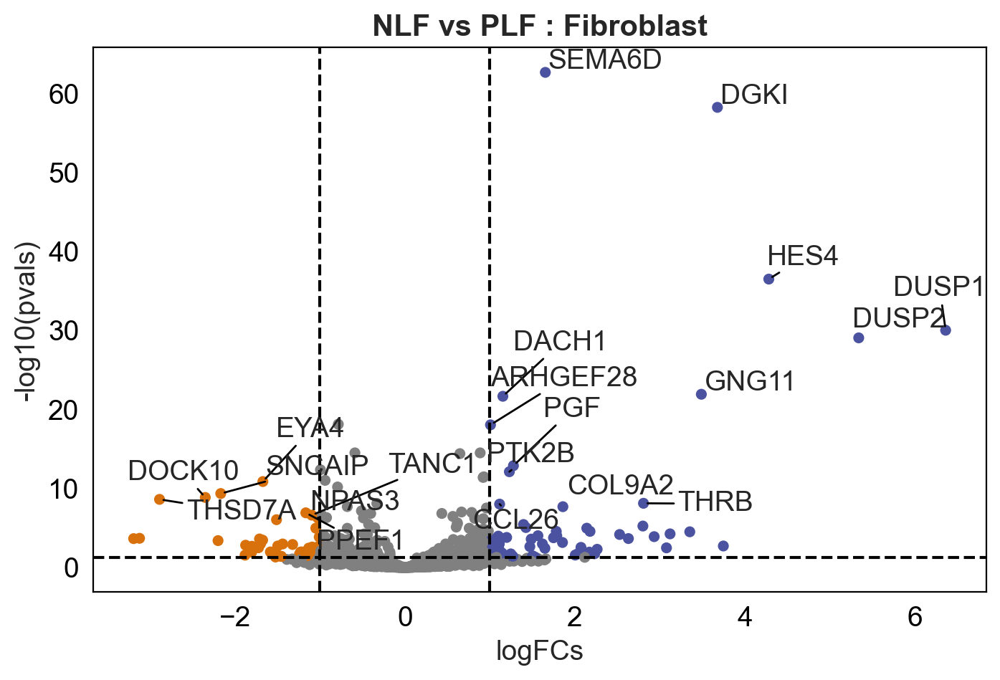

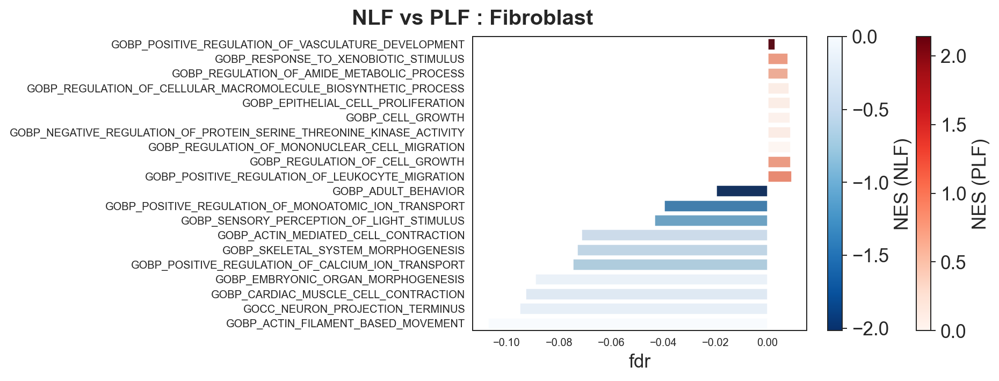

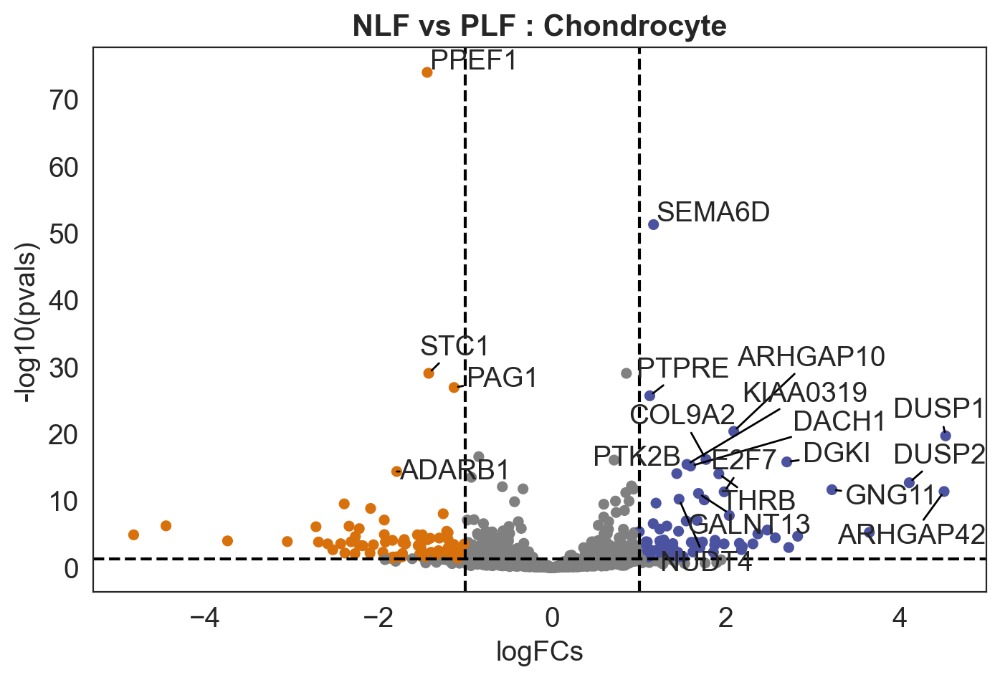

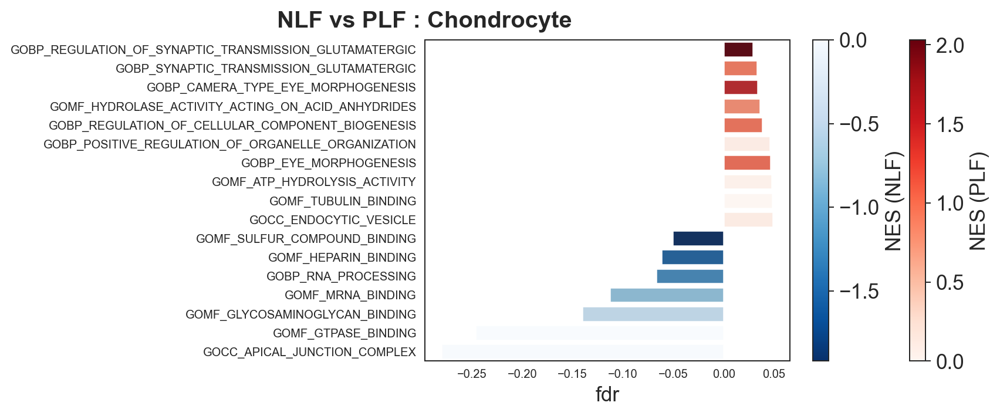

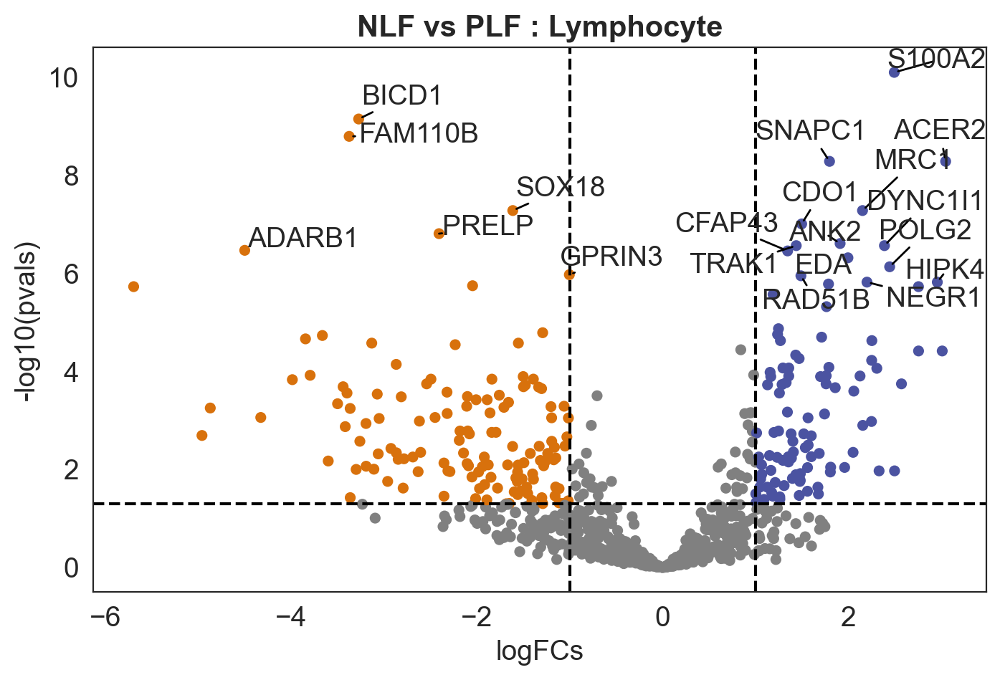

...

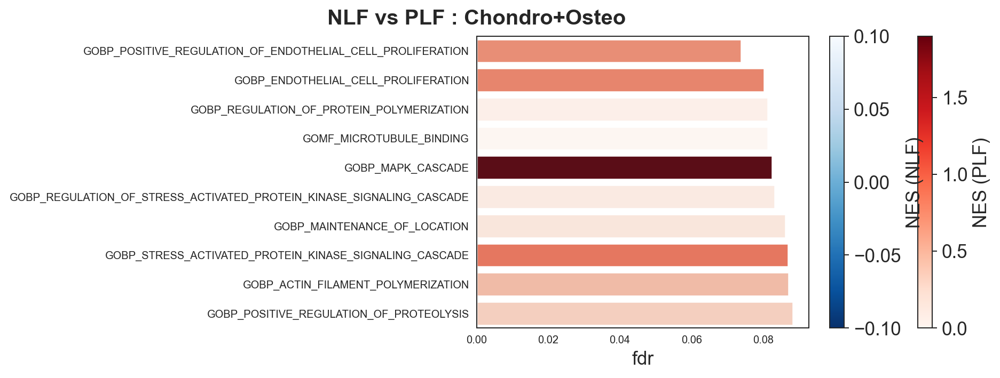

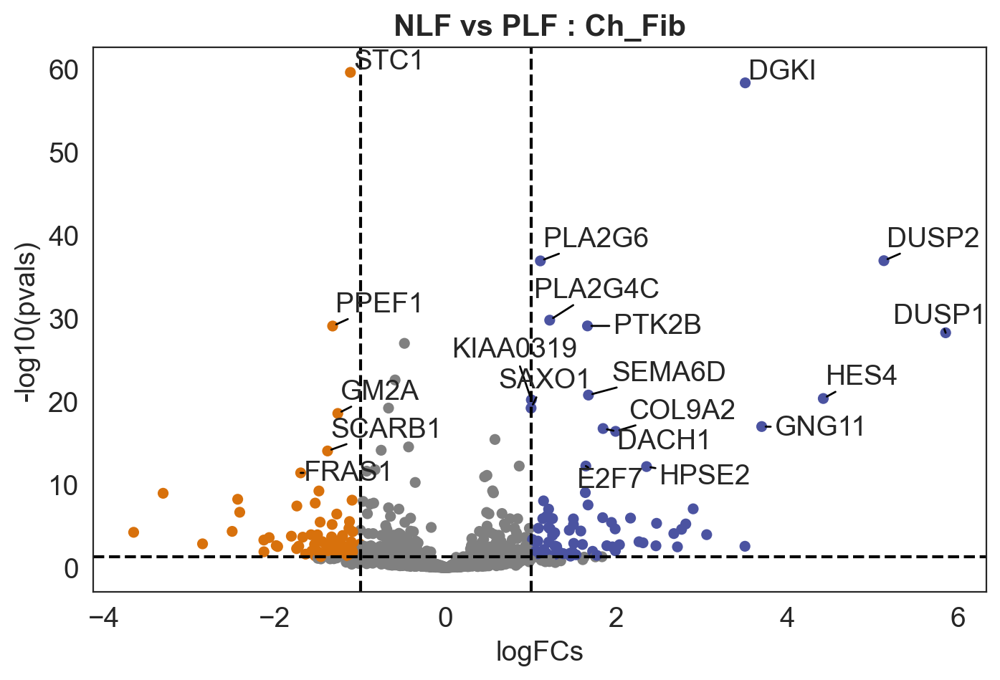

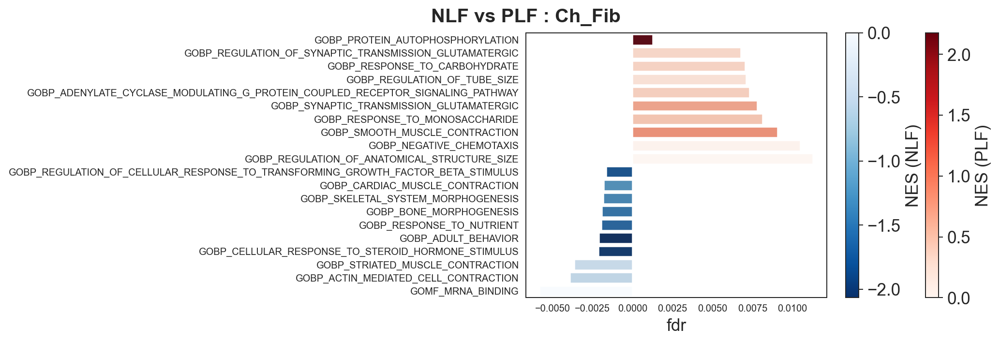

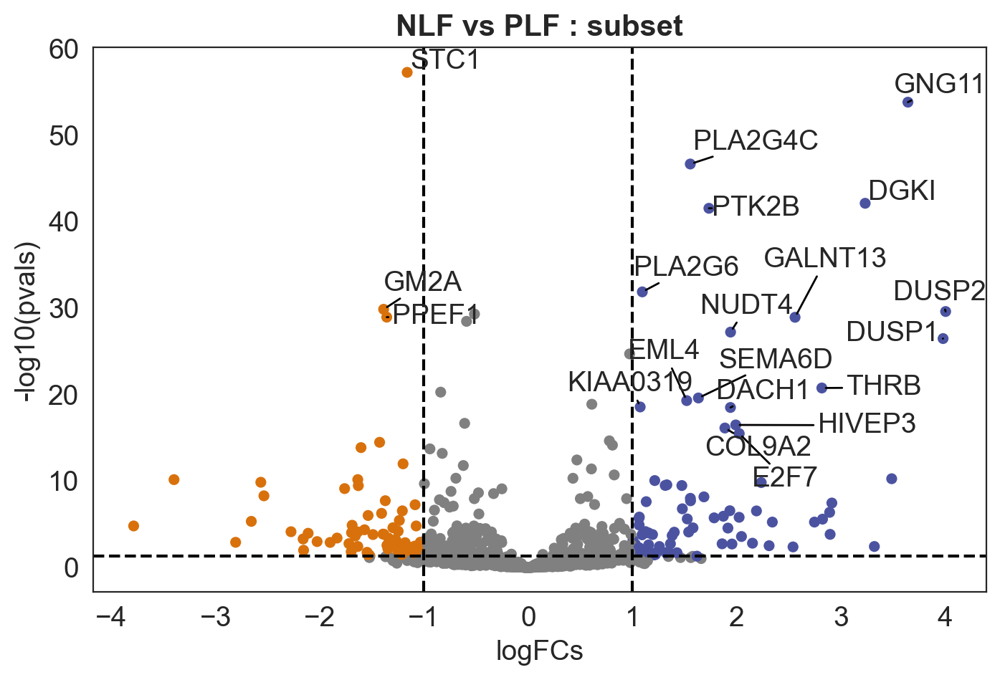

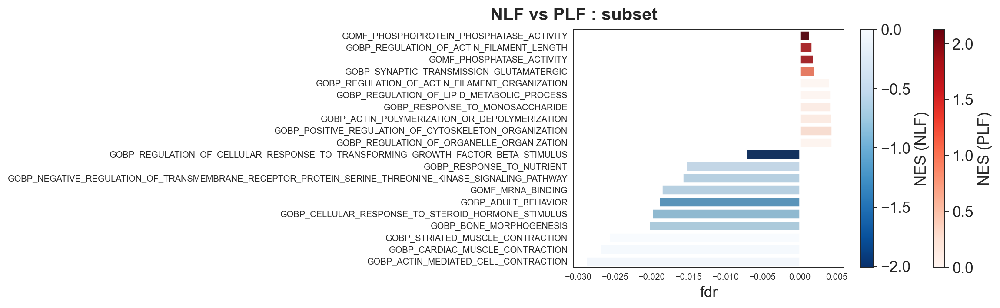

In [25]:
# target_labels, groups_col = "subset", "manual_celltype_annotation2"          
# target_labels, groups_col = "Fibroblast", "manual_celltype_annotation"  # "Chondro+Osteo", "Chondrocyte", "Fibroblast"

import pickle
import random
import decoupler as dc
from pydeseq2.dds import DeseqDataSet, DefaultInference
from pydeseq2.ds import DeseqStats


########################## Pseudobulk를 위해 sample별로 더 잘게 나눠주기  ##########################
NUM_replicate = 3
li = []
random.seed( 0 )
for k in range (  obj.adata.obs.shape[0] ):   # Cell 마다 돌면서 random하게 replicate 배정
    li.append (  str ( obj.adata.obs.iloc [k]["Sample"] ) + "_" + str ( random.randint (1, NUM_replicate) ) )
obj.adata.obs ["replicate"] = li



############################################    latest version: pydeseq2 이용 ######################################

class OBJECT:
    def __init__ ( self, target_labels):
        self.target_labels = target_labels
        self.groups_col =  "manual_celltype_annotation2" if self.target_labels == "subset" else  "manual_celltype_annotation3" if self.target_labels == "Ch_Fib" else "manual_celltype_annotation"

    def  pseudobulk ( self ):
        self.pdata = dc.get_pseudobulk ( obj.adata, sample_col = "replicate", groups_col = self.groups_col,  min_prop = 0.1, min_smpls = 1, layer = "counts" )  # pdata도 AnnData 형식
        #dc.plot_psbulk_samples(pdata, groupby =[ "manual_celltype_annotation2", "Sample"], figsize=(12, 4))
        self.pdata.layers["counts"] = self.pdata.X.copy()
        sc.pp.normalize_total ( self.pdata, target_sum = 1e4)
        sc.pp.log1p ( self.pdata )
        sc.pp.scale ( self.pdata, max_value = 10 )
        sc.tl.pca ( self.pdata )
        dc.swap_layer ( self.pdata, "counts", X_layer_key = None, inplace = True)  # Return raw counts to X

        # 관심있는 pdata만 가져오기 ( target_labels )
        self.pdata_i = self.pdata [ self.pdata.obs [ self.groups_col ] == self.target_labels].copy()
        self.pdata_i = self.pdata_i [ :, dc.filter_by_expr ( self.pdata_i, group = "condition", min_count = 10, min_total_count = 15 ) ].copy()


    def DEG ( self, figsize = (7, 5) ):
        inference = DefaultInference( )
        self.dds = DeseqDataSet ( adata = self.pdata_i, design_factors = "condition",  ref_level = [ "condition", "NLF"],  refit_cooks = True,  inference = inference, quiet = True)
        self.dds.deseq2()
        self.stat_res = DeseqStats ( self.dds, contrast = [ "condition", "PLF", "NLF" ] ,  inference = inference, quiet = True )
        self.stat_res.summary()
        self.results_df = self.stat_res.results_df

        if not os.path.exists(  "/data/project/OPLL/02.scRNA/script/scanpy/deg_df/{}".format (obj.Sample_ID) ):
            os.makedirs(  "/data/project/OPLL/02.scRNA/script/scanpy/deg_df/{}".format (obj.Sample_ID) )

        # Draw volcano plot
        fig, ax = plt.subplots(1, 1, figsize = figsize, dpi = 100)
        fig.subplots_adjust ( left = 0.08, right = 0.97 )
        sns.set_style("white") 
        dc.plot_volcano_df ( self.results_df,  x = 'log2FoldChange',  y = "padj", top = 20,  lFCs_thr = 1, lFCs_limit = 10, sign_limit = 100, color_pos = "#4B53A1", color_neg = "#D8710C",  ax = ax, dpi = 100 )
        ax.set_title ( "NLF vs PLF : {}".format ( self.target_labels), fontdict  = {"fontsize" : 15, "fontweight" : "semibold"}  )
        fig.show()
        fig.savefig ( "/data/project/OPLL/02.scRNA/script/scanpy/figures/{}/NichenetR_:00.Volcano_{}.jpg".format ( obj.Sample_ID, self.target_labels ))
        fig.savefig ( "/data/project/OPLL/02.scRNA/script/scanpy/deg_df/{}/Volcano_{}.jpg".format ( obj.Sample_ID, self.target_labels ))


    def NicheNetPrep ( self, p_threshold = 0.05, LFC_threshold  = 1):
        ############################ NicheNet (background_genes, geneset_oi) 및 DEG( updeg, downdeg ) 준비 ######################
        self.background_genes = sorted ( self.results_df.index.tolist() )
        self.updeg = self.results_df [ ( self.results_df [ "padj" ] <= p_threshold) & ( self.results_df [ "log2FoldChange" ] > 1 * LFC_threshold)]
        self.geneset_oi = sorted ( self.updeg.index.tolist() )
        self.downdeg = self.results_df [ ( self.results_df [ "padj" ] <= p_threshold) & ( self.results_df [ "log2FoldChange" ] < -1 * LFC_threshold)]
        self.down_geneset_oi = sorted ( self.downdeg.index.tolist() )

        # 결과 정리
        print ( "{}\n\tBackground: {}개\n\tUpDEG : {}개\n\tDownDEG : {}개\n".format ( self.target_labels, len ( self.background_genes ), len( self.geneset_oi ) , len( self.down_geneset_oi ) ))

        if not os.path.exists(  "/data/project/OPLL/02.scRNA/script/scanpy/83-3.Scanpy_NichenetR/2.markers/{}".format (obj.Sample_ID) ):
            os.makedirs(  "/data/project/OPLL/02.scRNA/script/scanpy/83-3.Scanpy_NichenetR/2.markers/{}".format (obj.Sample_ID) )
        pd.DataFrame ( self.background_genes ).to_csv ("/data/project/OPLL/02.scRNA/script/scanpy/83-3.Scanpy_NichenetR/2.markers/{}/background_genes_{}.txt".format ( obj.Sample_ID, self.target_labels ), sep = "\n", header = False, index = False)
        pd.DataFrame ( list ( self.geneset_oi ) ) .to_csv ("/data/project/OPLL/02.scRNA/script/scanpy/83-3.Scanpy_NichenetR/2.markers/{}/geneset_oi_{}.txt".format ( obj.Sample_ID, self.target_labels ), sep = "\n", header = False, index = False )

    def GO ( self, p_threshold = 0.05 ) :
        import go
        #mapper, goeaobj, GO_items, inv_map = go.main()
        self.GO_df  = go.ORA_DF ( list ( self.geneset_oi ) , mapper, goeaobj, GO_items, inv_map,  p_value = p_threshold )
        self.GO_down_df  = go.ORA_DF ( list ( self.down_geneset_oi ) , mapper, goeaobj, GO_items, inv_map,  p_value = p_threshold )

        output_dir = "/data/project/OPLL/02.scRNA/script/scanpy/deg_df/{}_{}".format (obj.Sample_ID, NUM_replicate)
        if not os.path.exists( output_dir ):
            os.makedirs( output_dir )
        self.GO_df [ self.GO_df [ "n_genes" ] >= 2 ].to_csv ( output_dir + "/df:updeg_{}.tsv".format ( self.target_labels ), sep = "\t", index = False)
        self.GO_down_df [ self.GO_down_df [ "n_genes" ] >= 2 ].to_csv ( output_dir + "/df:downdeg_{}.tsv".format ( self.target_labels ), sep = "\t", index = False)

    # GSEA  (prerank & cls 둘다)
    def GSEA ( self, permutation_num = 10000, fdr_threshold = 0.5 ):
        if not os.path.exists(  "/data/project/OPLL/02.scRNA/script/scanpy/gsea_df/{}_{}".format (obj.Sample_ID, NUM_replicate) ):
            os.makedirs(  "/data/project/OPLL/02.scRNA/script/scanpy/gsea_df/{}_{}".format (obj.Sample_ID, NUM_replicate ) )

        # self.prerank_res = GSEA_prerank( self.stat_res, permutation_num = permutation_num )
        # self.prerank_outdf = SELECT_PRNIT ( self.prerank_res, fdr_threshold = fdr_threshold, target_labels = self.target_labels, OUTPUT_PATH = "/data/project/OPLL/02.scRNA/script/scanpy/gsea_df/{}/df:gseapy_prerank_{}.tsv".format ( obj.Sample_ID, self.target_labels ) )

        self.gs_res, gene_exp = GSEA_cls ( self.pdata_i, permutation_num = permutation_num, target_labels = self.target_labels )
        self.cls_outdf = SELECT_PRNIT ( self.gs_res, fdr_threshold = fdr_threshold, target_labels = self.target_labels, OUTPUT_PATH = "/data/project/OPLL/02.scRNA/script/scanpy/gsea_df/{}/df:gseapy_cls_{}.tsv".format ( obj.Sample_ID, self.target_labels ) )


######################################################################################################################################################################################################
        
Fib = OBJECT ( "Fibroblast" )
Ch = OBJECT ( "Chondrocyte" )
Lym = OBJECT ( "Lymphocyte" )
Mac = OBJECT ( "Macrophage" )
End = OBJECT ( "Endothelial cells" )
Ch_Ost = OBJECT ( "Chondro+Osteo" )
Ch_Fib = OBJECT ( "Ch_Fib" )
subset = OBJECT ( "subset" )


for clust in [ Fib, Ch, Lym, Mac, End, Ch_Ost, Ch_Fib, subset]:
    clust.pseudobulk ()
    clust.DEG ( figsize = (7, 5) )
    clust.NicheNetPrep ( p_threshold = 0.05, LFC_threshold  = 1 )
    clust.GO ( p_threshold = 0.05 )
    clust.GSEA ( permutation_num = 15000, fdr_threshold = 0.5 )

    # # Save as pickle
    # with open( "/data/project/OPLL/02.scRNA/script/scanpy/pickle/{}.pickle".format ( clust.target_labels ) , 'wb') as f:
    #     pickle.dump( self,  f )

In [29]:
Fib.results_df.loc [ ["CXCL12", "NRXN3", "NLGN1", "EDN1",  "EDNRA", "EDNRB", "TNC"], :]

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
CXCL12,80.406967,0.090574,0.412535,0.219555,0.826218,0.904499
NRXN3,1857.243239,3.351334,0.699001,4.794464,0.000002,0.000031
NLGN1,3422.442465,0.284277,0.201078,1.413762,0.157432,0.318411
EDN1,51.667022,1.220468,0.450843,2.707082,0.006788,0.032070
EDNRA,187.356153,1.853525,0.461639,4.015093,0.000059,0.000693
EDNRB,782.928118,0.134385,0.154648,0.868977,0.384860,0.570688
TNC,502.949620,0.027333,0.131099,0.208492,0.834845,0.909604


[<Axes: xlabel='Gene Rank', ylabel='Ranked metric'>,
 <Axes: >,
 <Axes: >,
 <Axes: ylabel='Enrichment Score'>]

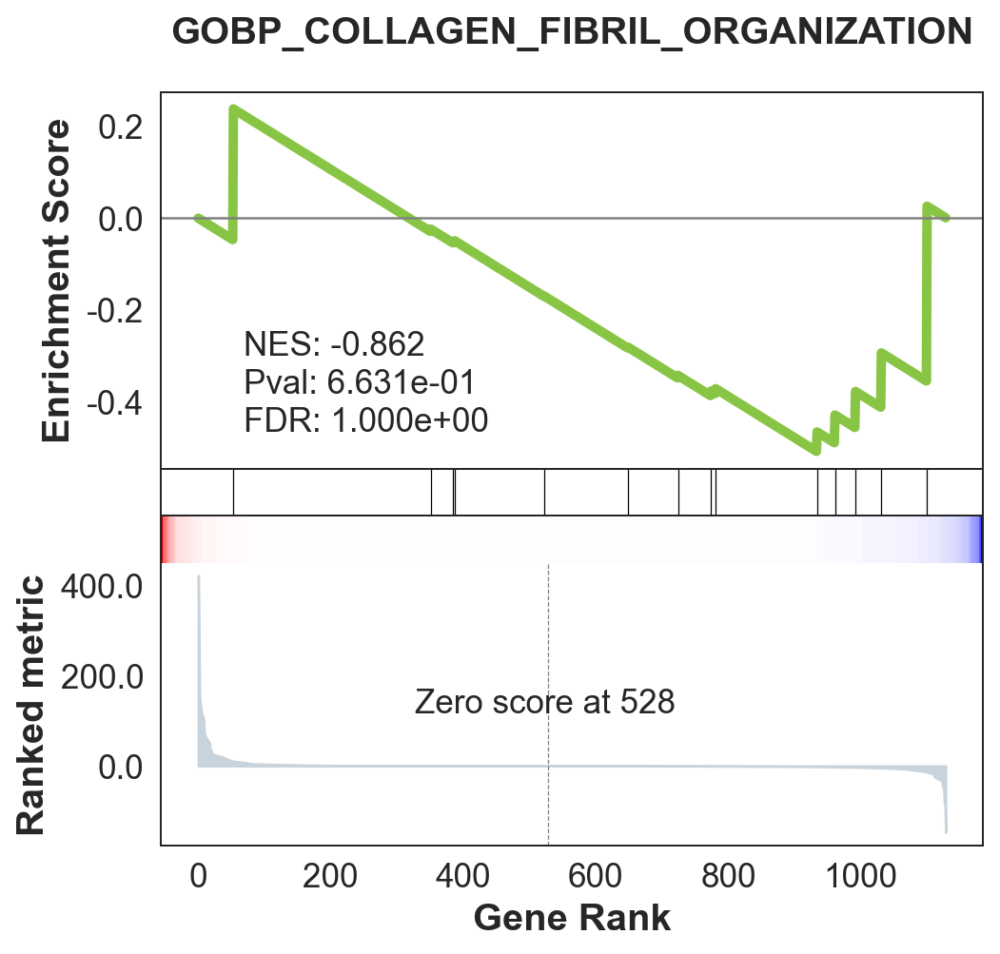

In [46]:
res = subset.gs_res
res = subset.prerank_res
term_to_graph = "GOBP_COLLAGEN_FIBRIL_ORGANIZATION"  # "GOCC_COLLAGEN_CONTAINING_EXTRACELLULAR_MATRIX"   #"GOCC_ACTIN_CYTOSKELETON"  # "GOBP_POSITIVE_REGULATION_OF_SUPRAMOLECULAR_FIBER_ORGANIZATION"  # "GOCC_ACTIN_CYTOSKELETON"  # "GOCC_COLLAGEN_CONTAINING_EXTRACELLULAR_MATRIX"    #"GOBP_MUSCLE_SYSTEM_PROCESS"
gseaplot ( rank_metric = res.ranking, term = term_to_graph, **res.results[term_to_graph] )

---

### Trajectory (scanpy PAGA):  오래걸림

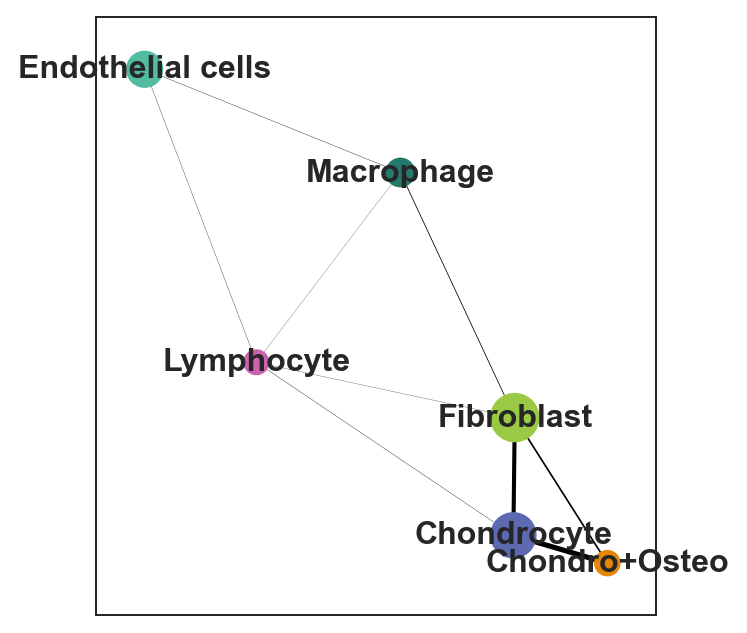

In [104]:
sc.tl.paga ( obj.adata, groups = "manual_celltype_annotation" )
sc.pl.paga ( obj.adata, color = [ "manual_celltype_annotation"  ] )
sc.tl.draw_graph ( obj.adata, init_pos = "paga" )
sc.pl.draw_graph(   obj.adata, color = [ "manual_celltype_annotation" ], legend_loc = "on data", cmap = my_cmap )  # FAT1

### Trajectory (Scanpy  Diffusion map & DPT)

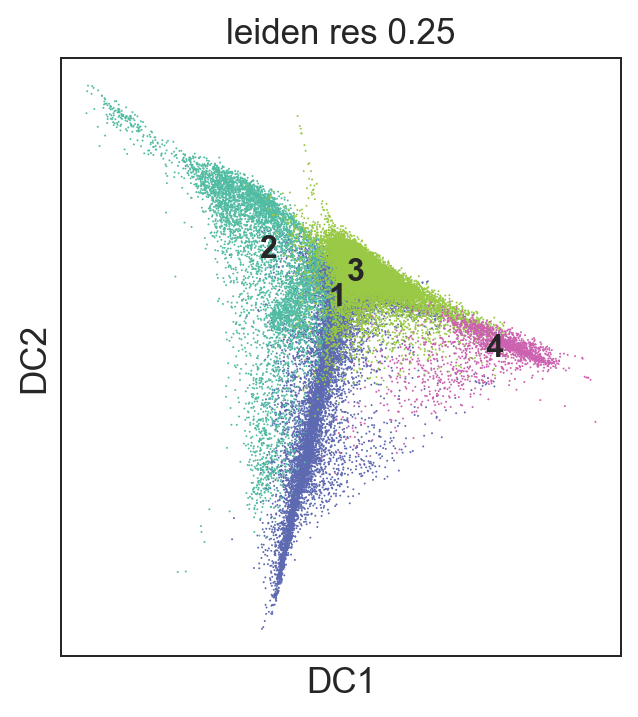

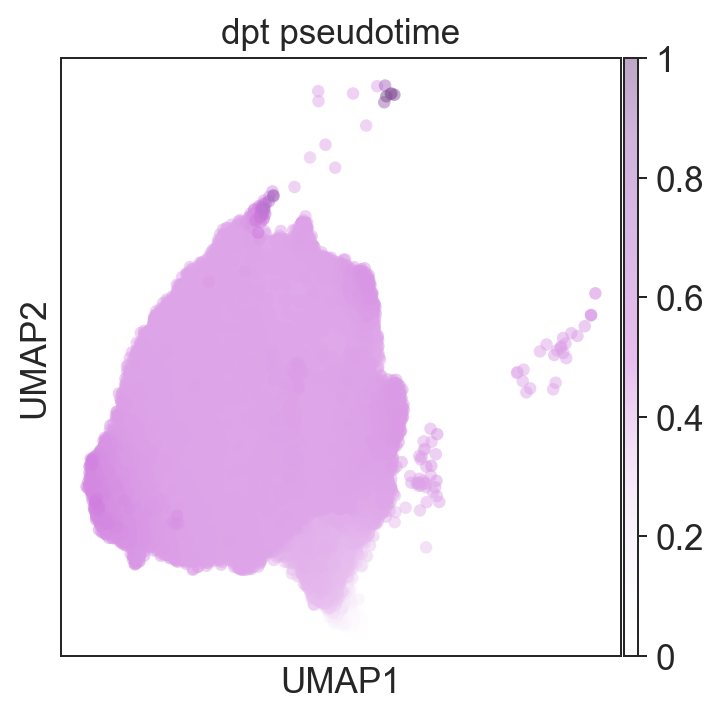

In [103]:
sc.tl.diffmap ( obj.adata_subset )

root_index = obj.adata_subset.obsm ["X_diffmap"][ : , 1 ].argmin()           # DC_1 축에서 가장 작은 애를 root_index로 고르자
sc.pl.scatter(
    obj.adata_subset , basis="diffmap",
    color = [ obj.cluster_name ], color_map = "Orange", legend_loc="on data",
    components = [1, 2],
)

obj.adata_subset.uns["iroot"] = root_index

sc.tl.dpt (obj.adata_subset )
sc.pl.scatter(
    obj.adata_subset,    basis = "umap",
    color = ["dpt_pseudotime", ], color_map =  my_cmap, legend_loc="on data", size = 100, alpha = 0.5
)

---

### pySCENIC : Gene regulation network (python==3.10, numpy==1.23)

In [10]:
import pyscenic
import loompy as lp
import scanpy as sc

tfs = [tf.strip() for tf in open( "/data/project/OPLL/02.scRNA/99.public/02.scRNA/SCENIC/allTFs_hg38.txt" )]   # all_TFs_hg38.txt로부터 모든 TF를 받아서 list로 만듬

print(     f"{np.sum( obj.adata.var.index.isin(tfs))} out of {len(tfs)} TFs are found in the obj.adataect" )          # 총 1797 TF database 중,  현재 obj.adataect는 309개의 TF를 분석 가능

# Create loom file 
row_attributes = {     "Gene": np.array(  obj.adata.var.index)  }
col_attributes = {
    "CellID": np.array( obj.adata.obs.index),
    "nGene": np.array(np.sum( obj.adata.X.transpose() > 0, axis=0)).flatten(),
    "nUMI": np.array(np.sum( obj.adata.X.transpose(), axis=0)).flatten(),
}

loom_path = "/data/project/OPLL/02.scRNA/99.public/02.scRNA/SCENIC/{}.loom".format (obj.Sample_ID)
lp.create( loom_path, obj.adata.X.transpose(), row_attributes, col_attributes)

84 out of 1797 TFs are found in the obj.adataect


In [12]:
import subprocess
outpath_adj = "/data/project/OPLL/02.scRNA/99.public/02.scRNA/SCENIC/{}.adj.csv".format ( obj.Sample_ID )
os.system ( "echo -e  " + " ".join ( ["pyscenic grn ", loom_path,  "/data/project/OPLL/02.scRNA/99.public/02.scRNA/SCENIC/allTFs_hg38.txt -o " , outpath_adj, "--num_workers 3" ] )  )
os.system ( "pyscenic  " + " ".join ( ["grn ", loom_path,  "/data/project/OPLL/02.scRNA/99.public/02.scRNA/SCENIC/allTFs_hg38.txt -o " , outpath_adj, "--num_workers 3" ] )  )
#!pyscenic grn {loom_path} {tfs_path} -o $outpath_adj --num_workers 3

pyscenic grn /data/project/OPLL/02.scRNA/99.public/02.scRNA/SCENIC/Integrated_10x_25.loom /data/project/OPLL/02.scRNA/99.public/02.scRNA/SCENIC/allTFs_hg38.txt -o /data/project/OPLL/02.scRNA/99.public/02.scRNA/SCENIC/Integrated_10x_25.adj.csv --num_workers 3


usage: pyscenic [-h] {grn,add_cor,ctx,aucell} ...
pyscenic: error: argument {grn,add_cor,ctx,aucell}: invalid choice: 'pyscenic' (choose from 'grn', 'add_cor', 'ctx', 'aucell')


512